# **Рынок заведений общественного питания Москвы**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
        
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
</div>

## Шаг 1. Загрузите данные и изучите общую информацию

In [4]:
# импортируем библиотеки
import pandas as pd
#для построения графиков
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import numpy as np
#для работы с геодинными
!pip install folium
import folium
from folium import Map, Marker # импортируем карту и маркер
from folium import Choropleth # импортируем Хороплет
from folium.plugins import MarkerCluster # импортируем кластер

In [5]:
# загружаем данные
mplaces = pd.read_csv('moscow_places.csv')

In [6]:
mplaces.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [7]:
mplaces.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


       
Для обработки данных импортирована библиотека pandas, для построения графиков библиотеки matplotlib, seaborn, plotly.express и plotly, а также numpy, для работы с геоданными - folium.
        
В БД 8406 строк, 13 столбцов,        
<br /> name — название заведения;
<br /> address — адрес заведения;
<br /> category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
<br /> hours — информация о днях и часах работы;
<br /> lat — широта географической точки, в которой находится заведение;
<br />  lng — долгота географической точки, в которой находится заведение;
<br /> rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
<br /> price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
<br /> avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    «Средний счёт: 1000–1500 ₽»;
    «Цена чашки капучино: 130–220 ₽»;
    «Цена бокала пива: 400–600 ₽». и так далее;
<br /> middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
<br /> middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
<br /> chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки): 
    0 — заведение не является сетевым
    1 — заведение является сетевым
<br /> district — административный район, в котором находится заведение, например Центральный административный округ;
<br /> seats — количество посадочных мест.     
<br /> При этом мы видим пропуски значений в столбцах
<br />hours              7870 non-null   object 
<br /> 8   price              3315 non-null   object 
<br /> 9   avg_bill           3816 non-null   object 
<br />10  middle_avg_bill    3149 non-null   float64
<br /> 13  seats              4795 non-null   float64    </div>

## Шаг 2. Выполните предобработку данных

In [10]:
#проверим, есть ли дубликты по имени и координатам
mplaces[mplaces.duplicated(subset=['name', 'lat', 'lng'])].sort_values(by='name')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


#Изменяем регистр всех названий на нижний и еще раз проверяем на дубликаты

In [12]:
mplaces['name'] = mplaces['name'].str.lower()

In [13]:
mplaces[mplaces.duplicated(subset=['name', 'lat', 'lng'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


In [14]:
mplaces.query('name == "more poke"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


In [15]:
mplaces = mplaces.drop_duplicates(subset=['name', 'lat', 'lng'], keep='last').reset_index(drop=True)

In [16]:
#осталось строк
len(mplaces)

8405

In [17]:
#посмотрим на уникальные значения категории
mplaces['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [18]:
#посмотрим на уникальные значения округа
mplaces['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Если необходимо будет, переименуем в сокращенные названия типа САО, СВАО etc

In [20]:
#уникальные значения рейтинга
mplaces['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

### Обработка пропусков

In [22]:
#пропуски в БД
mplaces.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5090
avg_bill             4589
middle_avg_bill      5256
middle_coffee_cup    7870
chain                   0
seats                3611
dtype: int64

In [23]:
# check 2
# пропущенные значения бары

def pass_value_barh_2(dfg):
    try:
        (
            (dfg.isna().sum())
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = 0, legend = False, fontsize = 16)
            .set_title('Пример 2' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')

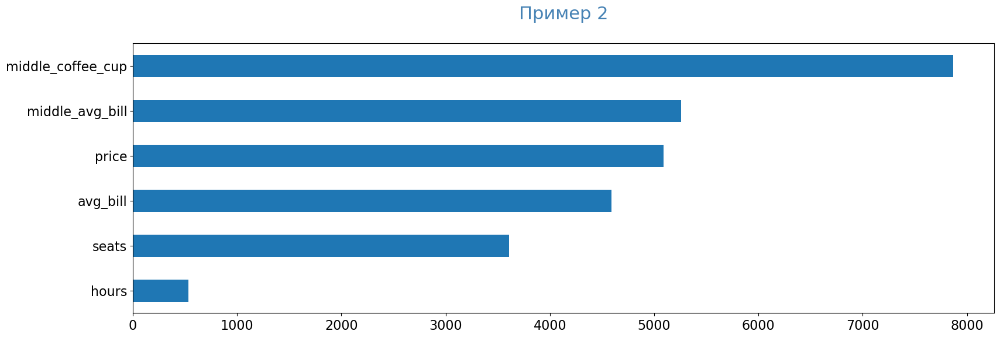

In [24]:
pass_value_barh_2(mplaces)

### Уникальные значения hours, price, 

In [26]:
#уникальные значения часов работы
mplaces['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [27]:
#Заменим пропуски часов работы на Нет информации
mplaces['hours']= mplaces['hours'].fillna('Нет информации')

In [28]:
#уникальные значения price
mplaces['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Надо определить, можем ли мы заполнить часть пропущенных значений price, avg_bill, middle_avg_bill и middle_coffee_cup, используя данных из этих же столбцов

In [30]:
mplaces.loc[(mplaces['avg_bill'].isnull() != True)].isnull().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                 743
avg_bill                0
middle_avg_bill       667
middle_coffee_cup    3281
chain                   0
seats                1445
dtype: int64

In [31]:
mplaces.loc[(mplaces['middle_avg_bill'].isnull() != True)].isnull().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                 470
avg_bill                0
middle_avg_bill         0
middle_coffee_cup    3149
chain                   0
seats                1159
dtype: int64

In [32]:
mplaces.loc[(mplaces['middle_coffee_cup'].isnull() != True)].isnull().sum()

name                   0
category               0
address                0
district               0
hours                  0
lat                    0
lng                    0
rating                 0
price                257
avg_bill               0
middle_avg_bill      535
middle_coffee_cup      0
chain                  0
seats                236
dtype: int64

При заполненных значениях avg_bill у  middle_avg_bill  667 пропущенных, у middle_coffee_cup 3281 и 743 пропущенных price

При middle_avg_bill -заполненных значениях, нет пропущенных значений avg_bill и 470 пропущенных price

При middle_coffee_cup  -заполненных значениях, нет пропущенных значений avg_bill 257 пропущенных price

Таким образом, данные в столбце avg_bill формируются, либо на основе данных middle_avg_bill или middle_coffee_cup, либо могут вносится отдельно, например, если там указано значение типа Цен бокала пива.
На основе данных middle_avg_bil и middle_coffee_cup или avg_bill мы можем заполнить часть значений price

### новый категориальный стобец avg_bill_category

In [35]:
#сделаем новый категориальный стобец по типу avg_bill с категориями Цена чашки капучино и т.п., 
#продублировав столбец avg_bill и убрав информацияю оттуда, после :

#создаем стобец с данными
avg_bill_category = mplaces['avg_bill']
 
# Затем вставляем его на 11 место
mplaces.insert(10, 'avg_bill_category', avg_bill_category)

In [36]:
# в столбце оставим категории среднего счета
mplaces['avg_bill_category'] = mplaces['avg_bill_category'].str.split(':').str[0]

In [37]:
mplaces['avg_bill_category'].unique()

array([nan, 'Средний счёт', 'Цена чашки капучино', 'Цена бокала пива'],
      dtype=object)

In [38]:
#Заменим пропуски avg_bill_category на unknown. 
mplaces['avg_bill_category']= mplaces['avg_bill_category'].fillna('unknown')

### Столбец price

In [40]:
#Заменим пропуски категори цены на unknown. 
mplaces['price']= mplaces['price'].fillna('unknown')

In [41]:
mplaces.groupby('price')['price'].count()

price
unknown          5090
высокие           478
выше среднего     564
низкие            156
средние          2117
Name: price, dtype: int64

In [42]:
# группируем по типу цены middle_avg_bill
mplaces.query('avg_bill_category == "Средний счёт"').groupby('price')['middle_avg_bill'].describe()

,count,mean,std,min,25%,50%,75%,max
price,,,,,,,,
unknown,470.0,575.802128,472.899054,30.0,300.0,403.0,650.0,4000.0
высокие,437.0,2472.631579,1870.130542,0.0,1750.0,2000.0,2500.0,35000.0
выше среднего,481.0,1344.189189,226.774410,375.0,1250.0,1250.0,1500.0,4500.0
низкие,93.0,217.311828,114.653161,90.0,150.0,180.0,250.0,600.0
средние,1668.0,598.908273,294.840114,165.0,350.0,500.0,850.0,2150.0


In [43]:
#используем верхнюю границу для определения категории цены для типа Средний счёт
up_board = mplaces.query('avg_bill_category == "Средний счёт"').groupby('price')['middle_avg_bill'].quantile(q=0.975)
up_board = up_board.reset_index()

In [44]:
up_board= up_board.sort_values(by='price')
up_board['upper_value'] = round(up_board['middle_avg_bill']).astype(int)
up_board.drop('middle_avg_bill', axis= 1 , inplace= True )
up_board

,price,upper_value
0,unknown,2000
1,высокие,5025
2,выше среднего,1650
3,низкие,560
4,средние,1100


In [45]:
# функция для определения категории цены по upper_value
def categorize_price_bill (bill):
    try:
        if 0 <= bill <= up_board.iloc [3]['upper_value']:
            return 'низкие'
        elif  up_board.iloc [3]['upper_value'] < bill <= up_board.iloc [4]['upper_value']:
            return 'средние'
        elif up_board.iloc[4]['upper_value'] < bill <= up_board.iloc [2]['upper_value']:
            return 'выше среднего'
        elif bill >=  up_board.iloc[2]['upper_value']:
            return 'высокие'
    except:
        pass   

In [46]:
#применяем функцию и определяем уровень цен для точек, у которых известен middle_avg_bill
mplaces.loc[(mplaces['price'] == 'unknown')& (mplaces['middle_avg_bill'].isnull() != True), 'price'] = \
mplaces['middle_avg_bill'].apply(categorize_price_bill)

In [47]:
# группируем по типу цены middle_coffee_cup
mplaces.query('avg_bill_category == "Цена чашки капучино"').groupby('price')['middle_coffee_cup'].describe()

,count,mean,std,min,25%,50%,75%,max
price,,,,,,,,
unknown,257.0,153.241245,66.904463,60.0,95.0,140.0,200.00,375.0
высокие,1.0,250.000000,NaN,250.0,250.0,250.0,250.00,250.0
выше среднего,2.0,203.000000,74.953319,150.0,176.5,203.0,229.50,256.0
низкие,57.0,136.614035,39.306831,60.0,110.0,139.0,154.00,256.0
средние,218.0,209.403670,107.683537,60.0,160.0,200.0,255.75,1568.0


In [48]:
#используем верхнюю границу для определения категории цены для типа Цена чашки капучино
up_board = mplaces.query('avg_bill_category == "Цена чашки капучино"').groupby('price')['middle_coffee_cup'].quantile(q=0.975)
up_board = up_board.reset_index()

In [49]:
up_board = up_board.sort_values(by='price')
up_board['upper_value'] = round(up_board['middle_coffee_cup']).astype(int)
up_board.drop('middle_coffee_cup', axis= 1 , inplace= True )
up_board

,price,upper_value
0,unknown,275
1,высокие,250
2,выше среднего,253
3,низкие,201
4,средние,300


In [50]:
#применяем функцию и определяем уровень цен для точек, у которых известен middle_coffee_cup
mplaces.loc[(mplaces['price'] == 'unknown')& (mplaces['middle_coffee_cup'].isnull() != True), 'price'] = \
mplaces['middle_coffee_cup'].apply(categorize_price_bill)

In [51]:
#проверим, у всех ли сетевых заведений указан уровень цены и один ли он и тот же для всех заведений одной цепим
mplaces.query('chain == 1').pivot_table(index='name', columns='price', values='chain', aggfunc='count', margins=True).\
sort_values(by='All', ascending=False).head(30)

price,unknown,высокие,выше среднего,низкие,средние,All
name,,,,,,
All,1637.0,103.0,203.0,387.0,875.0,3205
шоколадница,46.0,NaN,2.0,1.0,71.0,120
домино'с пицца,5.0,NaN,NaN,30.0,41.0,76
додо пицца,2.0,NaN,NaN,64.0,8.0,74
one price coffee,64.0,NaN,NaN,6.0,1.0,71
яндекс лавка,69.0,NaN,NaN,NaN,NaN,69
cofix,30.0,NaN,NaN,32.0,3.0,65
prime,24.0,NaN,NaN,10.0,16.0,50
хинкальная,21.0,2.0,3.0,NaN,18.0,44


In [52]:
# для сетевых заведений заменим price на наиболее встречающеся значение:
for n in mplaces.loc[(mplaces['chain'] == 1), 'name'].unique():
    try:
          mplaces.loc[(mplaces['name'] == n) &(mplaces['price'] == 'unknown'), 'price'] = \
          mplaces.loc[(mplaces['name'] == n) &(mplaces['price'] != 'unknown'), 'price'].mode()[0]
    except:
        pass

In [53]:
#проверим результат.
mplaces.query('chain == 1').pivot_table(index='name', columns='price', values='chain', aggfunc='count', margins=True).\
sort_values(by='All', ascending=False).head(30)

price,unknown,высокие,выше среднего,низкие,средние,All
name,,,,,,
All,738.0,143.0,260.0,711.0,1353.0,3205
шоколадница,NaN,NaN,2.0,1.0,117.0,120
домино'с пицца,NaN,NaN,NaN,30.0,46.0,76
додо пицца,NaN,NaN,NaN,66.0,8.0,74
one price coffee,NaN,NaN,NaN,70.0,1.0,71
яндекс лавка,69.0,NaN,NaN,NaN,NaN,69
cofix,NaN,NaN,NaN,62.0,3.0,65
prime,NaN,NaN,NaN,10.0,40.0,50
хинкальная,NaN,2.0,3.0,NaN,39.0,44


### avg_bill и seats

In [55]:
#Заменим пропуски avg_bill на unknown
mplaces['avg_bill']= mplaces['avg_bill'].fillna('unknown')

In [56]:
mplaces.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
avg_bill_category       0
middle_avg_bill      5256
middle_coffee_cup    7870
chain                   0
seats                3611
dtype: int64

Для seats оставим пропуски, так как при  замене на 0 будут искажаться данные. Тем более, что есть заведения, где указано именно 0 посадочных мест, то есть кафе и пекарни без возможности посадки.
Также оставим пропуски для столбцов middle_avg_bill и middle_coffee_cup

        name                    0
        category                0
        address                 0
        district                0
        hours                 536
        lat                     0
        lng                     0
        rating                  0
        price                5091
        avg_bill             4590
        middle_avg_bill      5257
        middle_coffee_cup    7871
        chain                   0
        seats                3611

### Создайте  столбец street с названиями улиц из столбца с адресом.

In [60]:
mplaces.groupby('address')['address'].count().sort_values(ascending=False).head(15)

address
Москва, проспект Вернадского, 86В          28
Москва, Усачёва улица, 26                  26
Москва, площадь Киевского Вокзала, 2       20
Москва, Ярцевская улица, 19                20
Москва, Щёлковское шоссе, вл75             16
Москва, Лесная улица, 20, стр. 3           16
Москва, Пресненская набережная, 2          16
Москва, Хорошёвское шоссе, 27              16
Москва, проспект Мира, 211к2               16
Москва, Каширское шоссе, 61Г               16
Москва, Профсоюзная улица, 56              15
Москва, проспект Мира, 211, корп. 2        15
Москва, улица Авиаконструктора Миля, 3А    15
Москва, Мытная улица, 74                   14
Москва, улица Вавилова, 3                  14
Name: address, dtype: int64

In [61]:
mplaces['street'] = mplaces['address'].str.split(',').str[1]
mplaces[['street', 'address']].head()

,street,address
0,улица Дыбенко,"Москва, улица Дыбенко, 7/1"
1,улица Дыбенко,"Москва, улица Дыбенко, 36, корп. 1"
2,Клязьминская улица,"Москва, Клязьминская улица, 15"
3,улица Маршала Федоренко,"Москва, улица Маршала Федоренко, 12"
4,Правобережная улица,"Москва, Правобережная улица, 1Б"


In [62]:
#проверим, все ли строки в столбце адрес содержат название города
len(mplaces[mplaces['address'].str.contains('Москва')])

8405

В БД все строки содержат город Москва в адресе

Ниже убираем лишние пробелы в колонке

In [65]:
mplaces['street'] = mplaces['street'].str.strip()

In [66]:
#проверяем результат
mplaces.query('street == "проспект Мира"').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,avg_bill_category,middle_avg_bill,middle_coffee_cup,chain,seats,street
718,все лень,ресторан,"Москва, проспект Мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,Средний счёт,1500.0,NaN,0,NaN,проспект Мира
786,старое место,кафе,"Москва, проспект Мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,Средний счёт,1000.0,NaN,0,NaN,проспект Мира
792,doner one,кафе,"Москва, проспект Мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,unknown,unknown,unknown,NaN,NaN,0,NaN,проспект Мира
800,пян-се,быстрое питание,"Москва, проспект Мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,низкие,unknown,unknown,NaN,NaN,1,NaN,проспект Мира
909,космос,кафе,"Москва, проспект Мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,unknown,unknown,unknown,NaN,NaN,0,NaN,проспект Мира


### Создайте столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
  логическое значение True — если заведение работает ежедневно и круглосуточно;
  логическое значение False — в противоположном случае.

In [68]:
mplaces.groupby('hours')['hours'].count().sort_values(ascending = False).head(15)

hours
ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
Нет информации                                          537
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
ежедневно, 09:00–21:00                                  203
ежедневно, 09:00–22:00                                  184
ежедневно, 12:00–23:00                                  178
ежедневно, 08:00–23:00                                  160
ежедневно, 08:00–22:00                                  148
ежедневно, 09:00–23:00                                  140
ежедневно, 11:00–00:00                                  127
ежедневно, 10:00–21:00                                  103
пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00     89
Name: hours, dtype: int64

In [69]:
def categorize_hours(hours):
    try:
        if hours == "ежедневно, круглосуточно":
            return 'True'
        elif  hours != "ежедневно, круглосуточно":
            return 'False'
    except:
        return 'False'

In [70]:
mplaces['is_24_7'] = mplaces['hours'].apply(categorize_hours)

In [71]:
mplaces[['hours', 'is_24_7']].head(15)

,hours,is_24_7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
5,"ежедневно, 10:00–23:00",False
6,пн 15:00–04:00; вт-вс 15:00–05:00,False
7,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",False
8,"ежедневно, 10:00–22:00",False
9,"ежедневно, 12:00–00:00",False


ВЫВОД: В данном разделе мы загрузили нужные в дальнейшем библиотеки и саму базу данных. 

Проверили базу на дубликаты по имени координатам, а также изучили уникальные значения столбцов category, district и rating.

Далее обработали пропуски:
1. Заменили пропуски часов работы на Нет информации
2. Заменили пропуски price на unknown
3. Используя значения среднего счета там, где возможно, определии уровень цен price.
3. По значению стоимости средней чашки кофе там, где возможно, также определили price
4. Для каждоый сети уровень price, заменим unknown на наиболее встречающеся значение

Для seats оставили пропуски, так как при  замене на 0 будут искажаться данные. Тем более, что есть заведения, где указано именно 0 посадочных мест, то есть кафе и пекарни без возможности посадки.
Также оставили пропуски для столбцов middle_avg_bill и middle_coffee_cup.

Следующим шагом был создан столбец street с названиями улиц, а также столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

## Шаг 3. Анализ данных

### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [75]:
category_chain = mplaces.pivot_table(index=['chain'], columns=['category'], values='address', aggfunc=['count'], margins=True) 
category_chain
category_chain.columns = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая', 'All']
category_chain = category_chain.reset_index()
category_chain

,chain,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
0,0,596,99,371,1599,693,303,1312,227,5200
1,1,169,157,232,779,720,330,730,88,3205
2,All,765,256,603,2378,1413,633,2042,315,8405


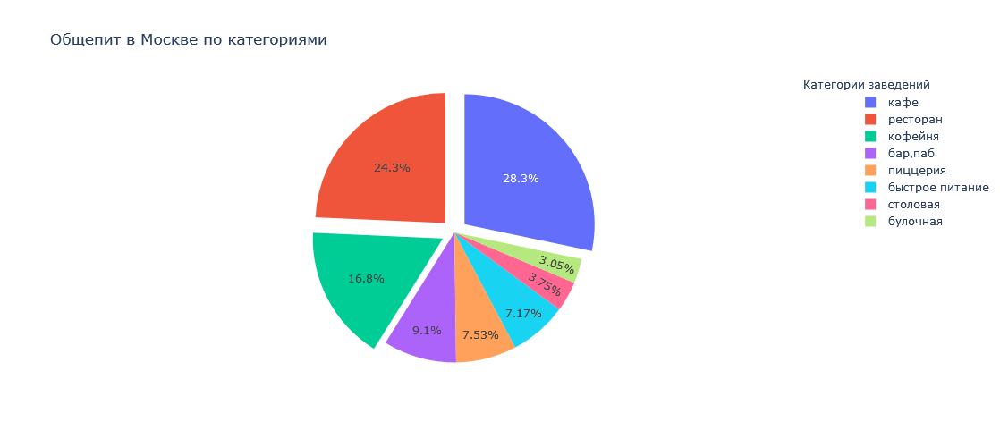

In [76]:
# строим диаграмму с сегментами
 # указываем значения, которые появятся на метках сегментов
fig = go.Figure(data=[go.Pie(labels=category_chain.columns[1:9],
                              # указываем данные, которые отобразятся на графике
                             values=category_chain.iloc[2, [1,2,3,4,5,6,7,8]],
                             # добавляем аргумент, который выделит сегмент-лидер на графике
                             pull = [0, 0, 0, 0.1, 0.1, 0, 0.1, 0])]) 
fig.update_layout(title='Общепит в Москве по категориями', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=500,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

Мы видим, в Москве три самые многочисленне категории общепита:

1. Кафе (2378 заведений) - 28%

2. Рестораны (2043 заведения) -  24%

3. Кофейни (1413 заведений) - 17%  

Оставшихся 31% точек общепита - это бары и пабы, пиццерии, быстрое питание, столовые и булочные.

In [78]:
mplaces_cat = mplaces.pivot_table(index=['category'], values='address', aggfunc=['count']).\
sort_values(by=[('count', 'address')], ascending=False)
mplaces_cat

,count
,address
category,
кафе,2378
ресторан,2042
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


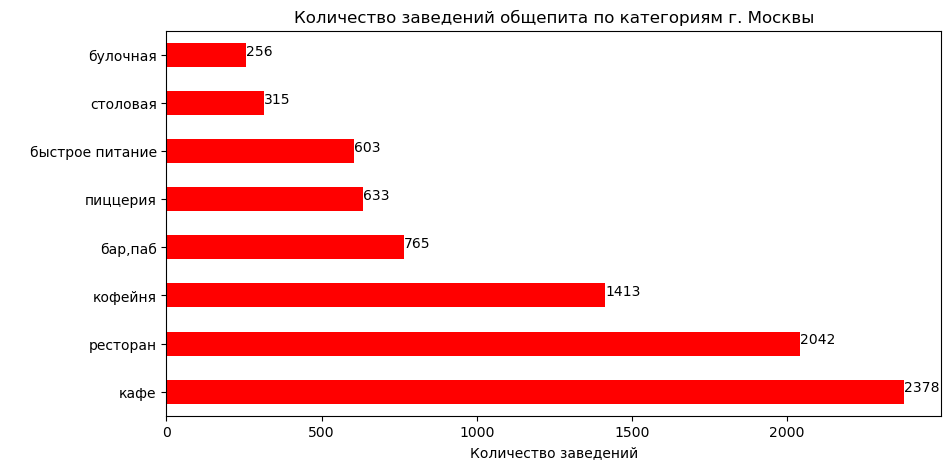

In [79]:
ax = mplaces_cat.plot(kind='barh', color='red', legend=False, figsize=(10,5))

for index, value in enumerate(mplaces_cat['count', 'address']):
    plt.text(value, index,
             str(value))
    

plt.title('Количество заведений общепита по категориям г. Москвы')
plt.xlabel('Количество заведений')
plt.ylabel(' ')
   
plt.show() 

### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше? Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [81]:
chain_part = mplaces.groupby('chain', as_index = False)['address'].count()
chain_part

,chain,address
0,0,5200
1,1,3205


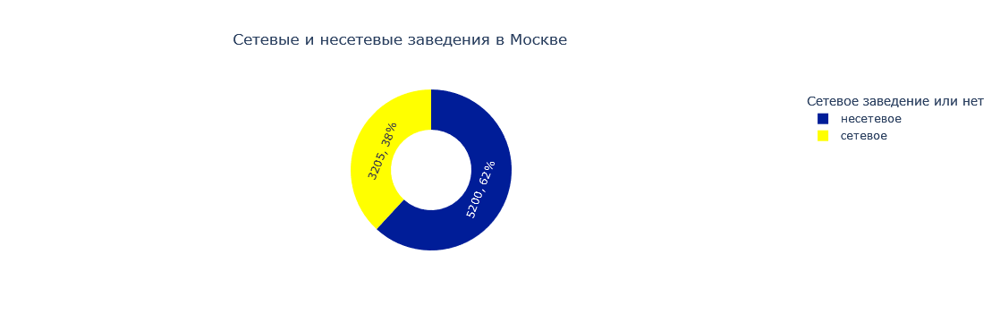

In [82]:
fig = px.pie(chain_part, values='address', names=chain_part['chain'].map({0: 'несетевое', 1: 'сетевое'}), 
             title='Сетевые и несетевые заведения в Москве', 
             labels='chain',  hole = 0.5, color_discrete_sequence = ["#001d98", '#ffff00'])

fig.update_layout(legend_title='Сетевое заведение или нет',
                    title={'x':0.4})
fig.update_traces(textinfo='value + percent', texttemplate = "%{value:}, %{percent:1.0%}")
                 
fig.show()

In [83]:
len(mplaces)

8405

In [84]:
chain_part.loc[1, 'address'] /len(mplaces)*100

38.13206424747174

In [85]:
# группируем данные по категории заведения и сети и считаем их количество
mplaces_chain = mplaces.groupby(['category', 'chain'],as_index = False)['address'].count()
mplaces_chain = mplaces_chain.sort_values(by='address')
mplaces_chain

,category,chain,address
15,столовая,1,88
2,булочная,0,99
3,булочная,1,157
1,"бар,паб",1,169
14,столовая,0,227
5,быстрое питание,1,232
10,пиццерия,0,303
11,пиццерия,1,330
4,быстрое питание,0,371
0,"бар,паб",0,596


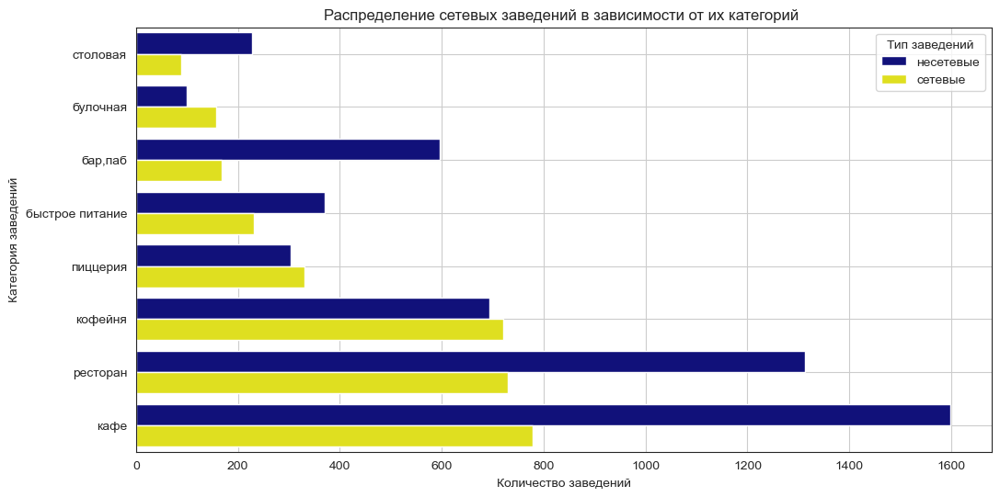

In [86]:
sns.set_style('white')
#новые названия для легенды 
#labels=["несетевые","сетевые"]
# назначаем размер графика
plt.figure(figsize=(12, 6))
# строим столбчатый график средствами seaborn
f=sns.barplot(data=mplaces_chain, x='address', y='category',  hue='chain', palette=["darkblue", "yellow"])
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение сетевых заведений в зависимости от их категорий ')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведений')
# поворачиваем подписи значений по оси X на 45 градусов
#plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=12)
#устанавливаем новые обозначения легенды и название легенды
legend_label = ["несетевые","сетевые"]
f.legend(title="Тип заведений")
#перебираем, чтобы оставить цвет и изменить толко название
n = 0
for i in legend_label:
    f.legend_.texts[n].set_text(i)
    n += 1
    
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

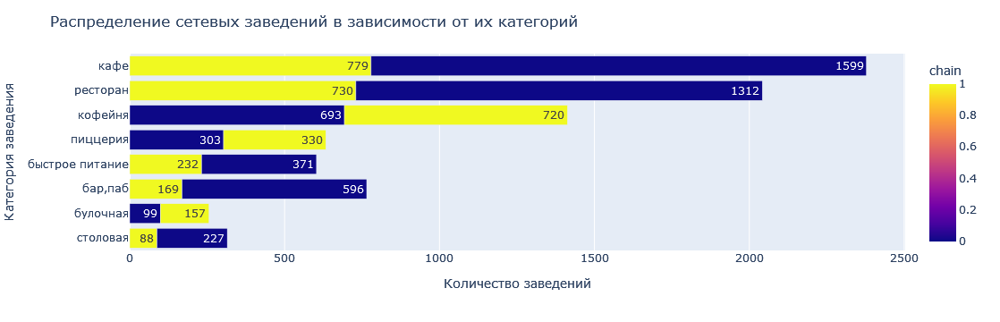

In [87]:
# строим столбчатую диаграмму c помощью plotly
fig = px.bar((mplaces_chain), # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             color='chain',
             text='address')
# оформляем график
fig.update_layout(showlegend=False,
                  title='Распределение сетевых заведений в зависимости от их категорий',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория заведения')
fig.show() # выводим график

In [88]:
# check
mplaces_chain_1 = mplaces_chain.copy()

mplaces_chain_1['chain'] = mplaces_chain_1['chain'].astype('category')
mplaces_chain_1[:2]

,category,chain,address
15,столовая,1,88
2,булочная,0,99


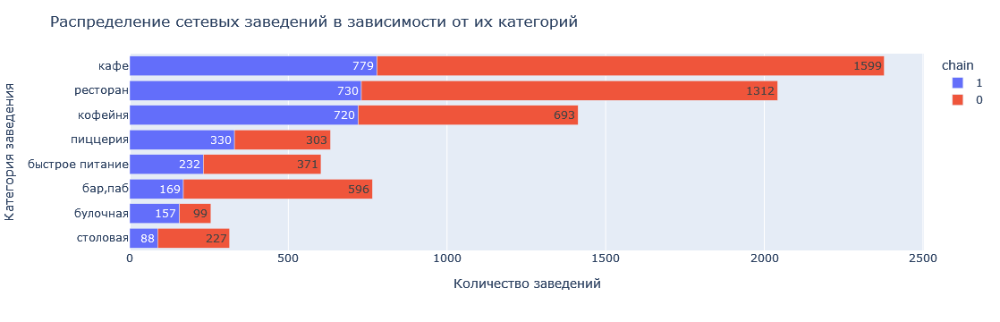

In [89]:
# check

fig = px.bar((mplaces_chain_1), # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             color='chain',
             text='address')
# оформляем график
fig.update_layout(#showlegend=True,
                  title='Распределение сетевых заведений в зависимости от их категорий',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория заведения')
fig.show() # выводим график


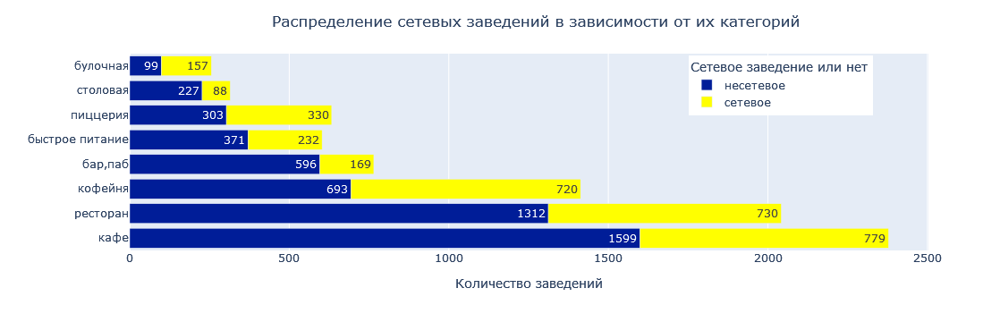

In [90]:
# check измененный

fig = px.bar((mplaces_chain_1.sort_values(by='address', ascending=False)), # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             color='chain',
             text='address',
             color_discrete_sequence = ["#001d98", '#ffff00'])
           
# оформляем график
fig.update_layout(title='Распределение сетевых заведений в зависимости от их категорий',
                   xaxis_title='Количество заведений',
                  yaxis_title=' ')
fig.update_layout(legend_title='Сетевое заведение или нет',
                    title={'x':0.8},
                 legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.70))
                 
# расшифровка легенды
new = {'0': 'несетевое', '1': 'сетевое'}
fig.for_each_trace(lambda t: t.update(name = new[t.name]))
fig.show() # выводим график
#color=long_df["medal"].map({"gold":"first","silver":"second","bronze":"third"})

In [91]:
percent_net = (category_chain.iloc[1]['бар,паб':]/category_chain.iloc[2]['бар,паб':])*100
percent_net = percent_net.sort_values(ascending=True)
percent_net = percent_net.reset_index()
percent_net.columns=['category', 'доля сетей']
percent_net['доля сетей'] = round((percent_net['доля сетей'].astype(float)).astype(int),0)

In [92]:
percent_net['доля несетевых заведений'] =100 - percent_net['доля сетей']
percent_net

,category,доля сетей,доля несетевых заведений
0,"бар,паб",22,78
1,столовая,27,73
2,кафе,32,68
3,ресторан,35,65
4,All,38,62
5,быстрое питание,38,62
6,кофейня,50,50
7,пиццерия,52,48
8,булочная,61,39


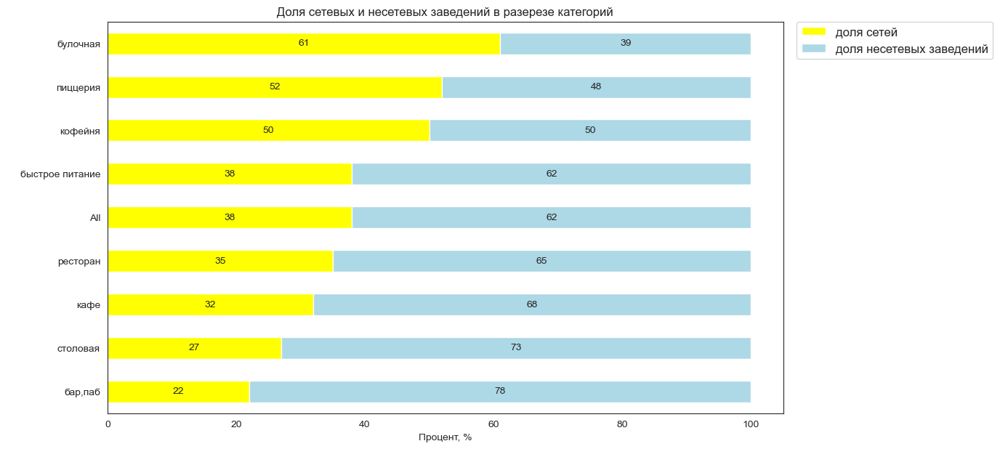

In [93]:
ax = percent_net.set_index('category').\
plot(kind='barh', stacked= True , color=['yellow', 'lightblue'], figsize=(12, 7))

#add overall title
plt.title('Доля сетевых и несетевых заведений в разерезе категорий', fontsize= 12 )

plt.xlabel('Процент, %')
plt.ylabel(' ')

#выносим легенду за график
plt.legend(bbox_to_anchor=( 1.02 , 1 ), loc='upper left', borderaxespad= 0, fontsize=12)

for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    if width > 0:
         ax.annotate(f'{width:0.0f}', xy=(left+width/2, bottom+height/2), ha='center', va='center')
    
plt.show()

Вывод: В Москве 38% сетевый заведений. 
Наибольшее количество сетевых заведений встречается в категориях булочная, пицерия и кофейня.
Меньше всего сетевых заведений в категории бар,паб, что и видно на графике.

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [96]:
#для анализа исключим заведения, у которых нет данных о посадочных местах, 
#то есть с пропущенны и значениями seats
seats_cat = mplaces.query('seats.isnull() != True') \
.pivot_table(index='category', values='seats', aggfunc=['median'])
seats_cat = seats_cat.reset_index()
seats_cat.columns=['category', 'median']
seats_cat['median'] = seats_cat['median'].astype(int)
seats_cat = seats_cat.sort_values(by='median')
seats_cat

,category,median
1,булочная,50
5,пиццерия,55
3,кафе,60
2,быстрое питание,65
7,столовая,75
4,кофейня,80
0,"бар,паб",82
6,ресторан,86


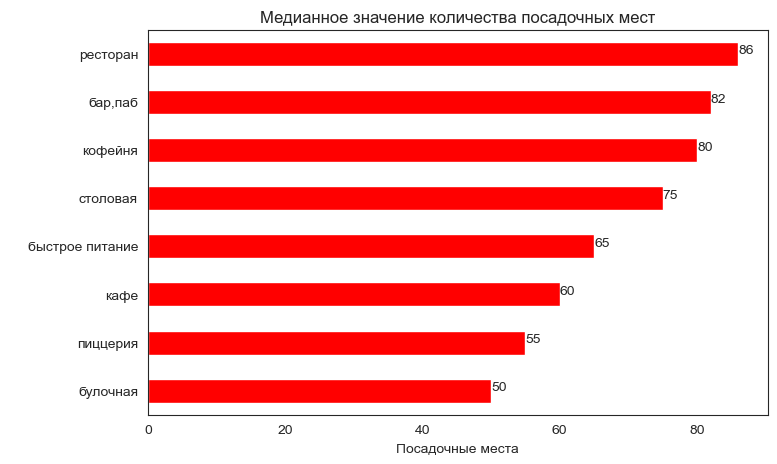

In [97]:
seats_cat.plot(x='category', y='median', kind='barh', color='red', figsize=(8,5), legend=False)


for index, value in enumerate(seats_cat['median']):
    plt.text(value, index,
             str(value))
    
plt.xlabel('Посадочные места')
plt.ylabel(' ')
plt.title('Медианное значение количества посадочных мест')


plt.show()

Как показывает ниже блоксплот, у нас есть выбросы по количеству посадочных мест.    <br />  
С одной стороны, они могут быть реально существующими заведения с большим количеством мест, например, банкетные рестораны и тп залы.    <br />     
С другой стороны, могут быть ошибками данных: например, ошибка при записи в разряде - вместо 12 мес указано 120, либо просто ошибка при вводе данных, как эта пекарня.    <br /> 
Поэтому, возможно был смысл при обработке данных исключить такие заведения, где количество мест превышает 400 мест, или провести ручную проверку, или заменить количество посадоных на медианное значение в категории
  </div>

In [99]:
# выведем основные статистические характеристики количества посадочных мест по категориям заведений  
grouped = mplaces.query('seats.isnull() != True').groupby('category')['seats'].describe()
grouped = grouped.sort_values(by='50%')
grouped

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
булочная,148.0,89.385135,97.685844,0.0,25.00,50.0,120.0,625.0
пиццерия,427.0,94.496487,112.282703,0.0,30.00,55.0,120.0,1288.0
кафе,1218.0,97.512315,117.985084,0.0,35.25,60.0,120.0,1288.0
быстрое питание,349.0,98.891117,106.611739,0.0,28.00,65.0,140.0,1040.0
столовая,164.0,99.750000,122.951453,0.0,40.00,75.5,117.0,1200.0
кофейня,751.0,111.199734,127.837772,0.0,40.00,80.0,144.0,1288.0
"бар,паб",468.0,124.532051,145.011574,0.0,48.00,82.5,150.0,1288.0
ресторан,1269.0,121.892041,123.792216,0.0,48.00,86.0,150.0,1288.0


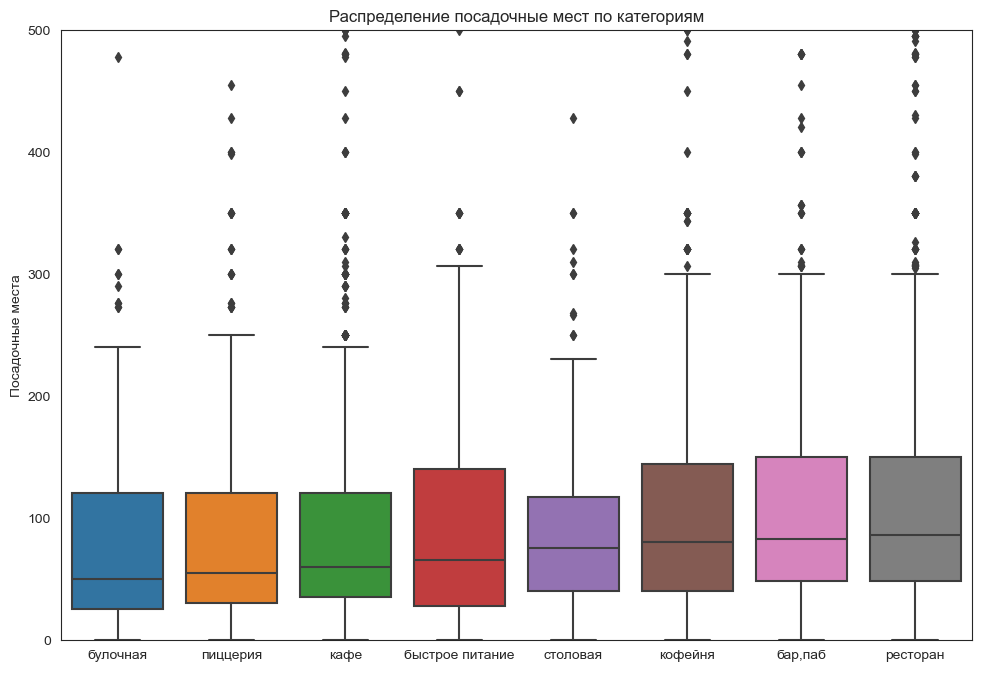

In [100]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(10, 7))
sns.boxplot(x='category', y='seats', data=mplaces.query('seats.isnull() != True'), order=grouped.index).set_title('Распределение посадочные мест по категориям')
plt.subplots_adjust(bottom=0.8, top=2)
plt.tight_layout()
plt.xlabel(' ')
plt.ylabel('Посадочные места')
plt.ylim([0,500])
plt.show()

ВЫВОД: Медианое значение количества посадочных мест показывает, что наименьше количество посадочных мест в булочных, наибольшее - в ресторанах.

По статистическим характеристикам можно определить эффективное количество мест в заведении в соответствии с форматом. 

Так, 25% квартиль показывает, в заведении должно быть не менее 25-30 посадочных мест для булочных, заведений быстрого питаний и пиццерий, и не менее 40 мест  - для кофейн и столовых, 38 - для кафе и 48 - для ресторанов и баров. Это вполне объяснимо: чем чаще сменяемость клиентов, тем меньше можно установить посадочных мест. Для ресторано и пабов(баров), где люди задерживаются намного дольше, количество посадочных мест в среднем будет больше.

Диаграмма распределения визуально показывает выбросы по количеству мест по каждой категории заведения. Как ориентир для оптималное максимального количества мест можно считат 75% квантиль.


### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [103]:
mplaces.groupby('name')['address'].count().sort_values(ascending = False).head(15)

name
кафе                                   189
шоколадница                            120
домино'с пицца                          77
додо пицца                              74
one price coffee                        72
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
шаурма                                  43
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
ресторан                                34
Name: address, dtype: int64

In [104]:
#Хинкальная - что это сеть или все заведения, где подают хинкали?
mplaces.query('name == "хинкальная"').groupby('chain')['chain'].count()

chain
1    44
Name: chain, dtype: int64

In [105]:
#Шаурма - что это сеть или все заведения, где подают шаурму?
mplaces.query('name == "шаурма"').groupby('chain')['chain'].count()

chain
0    43
Name: chain, dtype: int64

In [106]:
#Столовая - что это сеть или нет?
mplaces.query('name == "столовая"').groupby('chain')['chain'].count()

chain
0    28
Name: chain, dtype: int64

In [107]:
#для определения ТОП-15 сетей исключим из названий Кафе, Шаурма, Ресторан
top_15 = mplaces.query('name not in ["кафе", "шаурма", "ресторан", "столовая"]').\
pivot_table(index=['name', 'category', 'chain'], values=['address'], aggfunc=['count']).\
sort_values(by=[('count', 'address')], ascending = False).head(15)
top_15.columns = ['количество']
top_15 = top_15.reset_index()
top_15

,name,category,chain,количество
0,шоколадница,кофейня,1,119
1,домино'с пицца,пиццерия,1,76
2,додо пицца,пиццерия,1,74
3,one price coffee,кофейня,1,71
4,яндекс лавка,ресторан,1,69
5,cofix,кофейня,1,65
6,prime,ресторан,1,49
7,кофепорт,кофейня,1,42
8,кулинарная лавка братьев караваевых,кафе,1,39
9,теремок,ресторан,1,36


In [108]:
# check
mplaces.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8405 entries, 0 to 8404
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8405 non-null   object 
 1   category           8405 non-null   object 
 2   address            8405 non-null   object 
 3   district           8405 non-null   object 
 4   hours              8405 non-null   object 
 5   lat                8405 non-null   float64
 6   lng                8405 non-null   float64
 7   rating             8405 non-null   float64
 8   price              8405 non-null   object 
 9   avg_bill           8405 non-null   object 
 10  avg_bill_category  8405 non-null   object 
 11  middle_avg_bill    3149 non-null   float64
 12  middle_coffee_cup  535 non-null    float64
 13  chain              8405 non-null   int64  
 14  seats              4794 non-null   float64
 15  street             8405 non-null   object 
 16  is_24_7            8405 

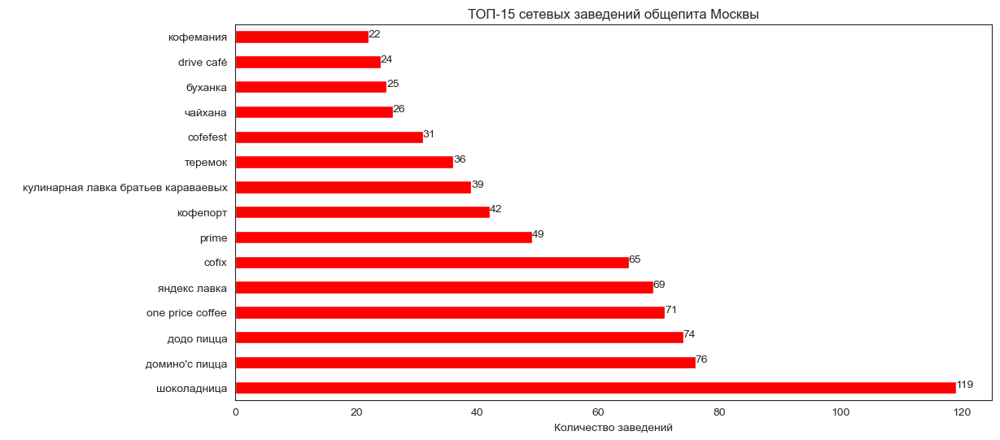

In [109]:
top_15.plot(x='name', y='количество', kind='barh', color='red', legend=False, figsize=(12,6))

for index, value in enumerate(top_15['количество']):
    plt.text(value, index,
               str(value))

plt.title('ТОП-15 сетевых заведений общепита Москвы')
plt.xlabel('Количество заведений')
plt.ylabel(' ')

plt.show()

In [110]:
#топ-15 заведений по категориям
top_15_category = top_15.groupby('category')['количество'].sum().sort_values()
top_15_category = top_15_category.reset_index()
top_15_category['percent']=round(top_15_category['количество']/top_15_category['количество'].sum()*100, 0).astype(int)
top_15_category

,category,количество,percent
0,булочная,25,3
1,кафе,89,12
2,пиццерия,150,20
3,ресторан,154,20
4,кофейня,350,46


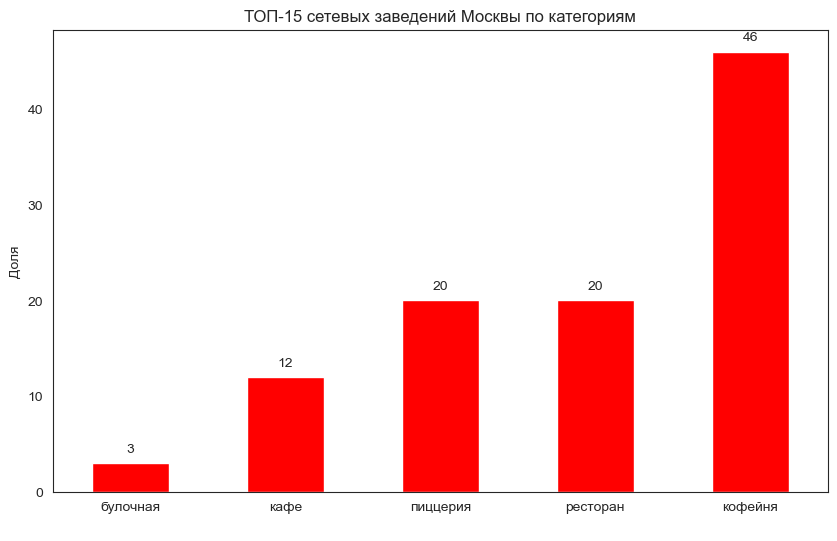

In [111]:
ax = top_15_category.plot(x='category', y='percent', kind='bar', color='red', legend=False, figsize=(10,6))

plt.title('ТОП-15 сетевых заведений Москвы по категориям')
plt.xlabel(' ')
plt.ylabel('Доля')
plt.xticks(rotation=0)

for p in ax.patches:
    ax.annotate(text=np.round(p.get_height(), decimals=2),
                xy=(p.get_x()+p.get_width()/2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()

ВЫВОД: ТОП-15 сетевых заведений Москвы по количеству в большинстве своем являются кофейнями, булочными, пицериями, скажем, заведениями малого формата с большой проходимостью людей. 

46%  заведений - это кофейни, 20% рестораны и пиццерии, 12% кафе и 2% булочные.

Лидер сетевых заведений - это сеть кофеен Шоколадница со 119 заведениями в Москве.

При этом Теремок и Prime, хотя и относятся к категории "ресторан", явно являются классическими кафе по типу Братев Караваевых, Яндекс Лавка тоже не является рестораном, а скорее, магазином-кафе готовой еды. 

В ТОП-15 фактически не вошел ни один ресторан.

In [113]:
# check
x = mplaces.copy()
df_chain = x[x['chain'] == 1] 
 
(
    df_chain
    .groupby(['name', 'category']).agg(count_name=('name', 'count')).sort_values(by='count_name').tail(15)
    .reset_index()
    .groupby('category')['count_name'].sum()
    .to_frame()
    .assign(percent_total=lambda x: x / x.sum()).round(2)
    .sort_values(by='percent_total')
)

,count_name,percent_total
category,,
булочная,25,0.03
кафе,89,0.12
пиццерия,150,0.20
ресторан,154,0.20
кофейня,350,0.46


### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [115]:
#количество заведения общепита по районам
distr_grouped = mplaces.groupby(['district'])['name'].count()
distr_grouped = distr_grouped.reset_index()
distr_grouped = distr_grouped.sort_values(by='name', ascending =  False)
distr_grouped

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,899
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


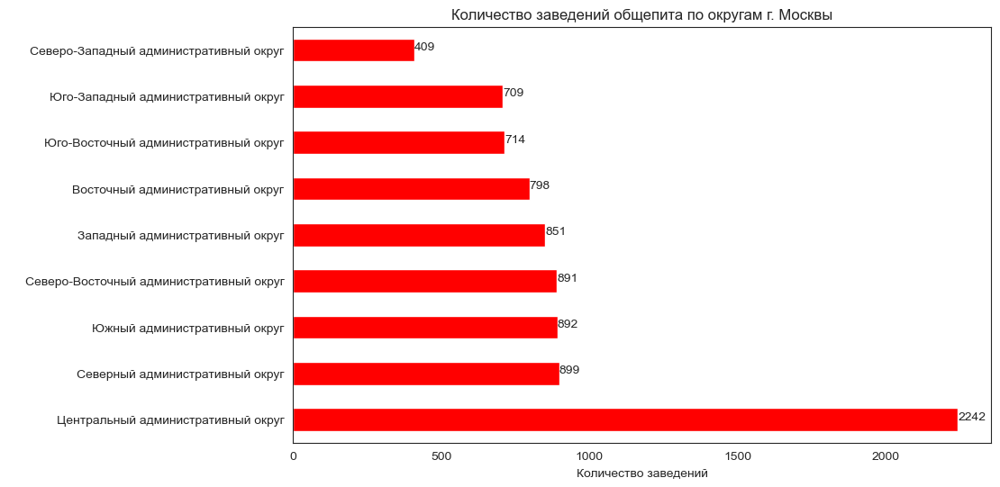

In [116]:
distr_grouped.plot(x='district', y='name',kind='barh', color='red', legend=False, figsize=(10,6))

for index, value in enumerate(distr_grouped['name']):
     plt.text(value, index,
                 str(value))

plt.title('Количество заведений общепита по округам г. Москвы')
plt.xlabel('Количество заведений')
plt.ylabel(' ')

plt.show()

In [117]:
mplaces.pivot_table(index='category', columns='district', values='name', aggfunc='count', margins=True)

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ,All
category,,,,,,,,,,
"бар,паб",53,50,68,63,23,364,38,38,68,765
булочная,25,37,39,28,12,50,13,27,25,256
быстрое питание,71,62,58,82,30,87,67,61,85,603
кафе,272,239,235,269,115,464,282,238,264,2378
кофейня,105,150,193,159,62,428,89,96,131,1413
пиццерия,72,71,77,68,40,113,55,64,73,633
ресторан,160,218,188,182,109,670,145,168,202,2042
столовая,40,24,41,40,18,66,25,17,44,315
All,798,851,899,891,409,2242,714,709,892,8405


C:\Users\tanya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



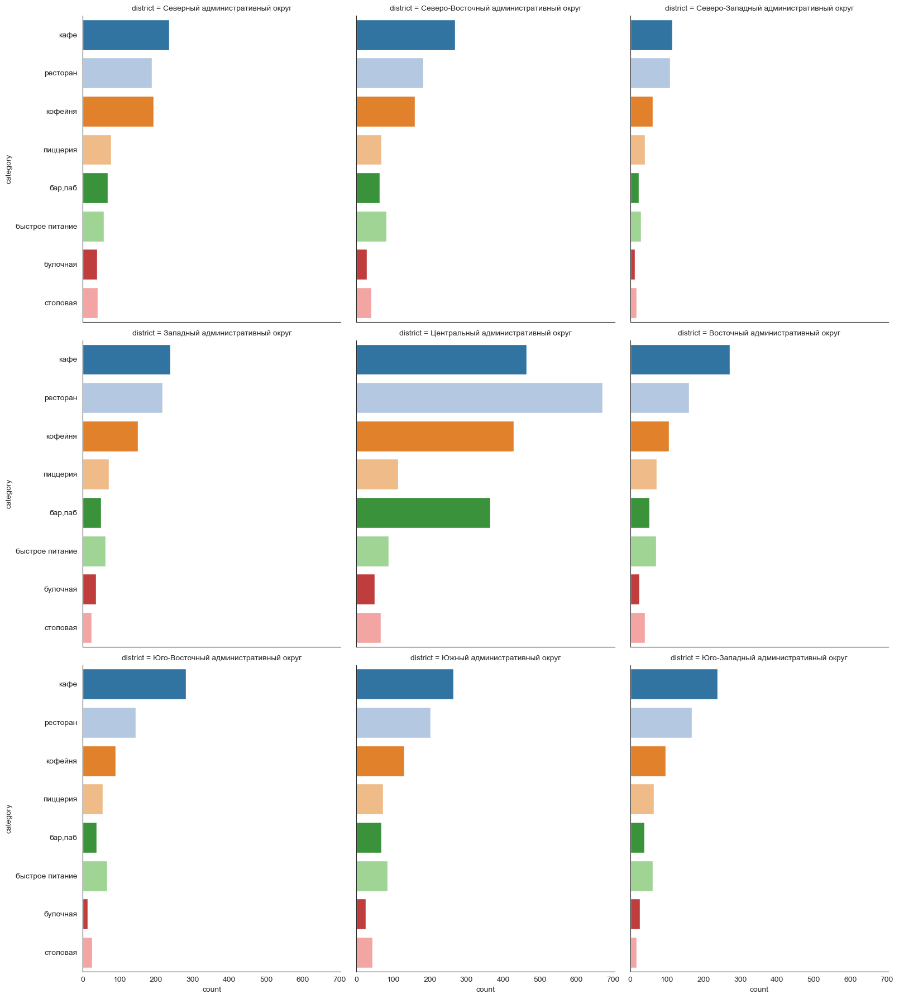

In [118]:
#Распределение категорий объектов общепита по округам

g = sns.catplot(y="category", col="district", col_wrap=3,
                data=mplaces,
                kind="count", height=6, aspect=.9, 
                palette='tab20')
    
plt.show()

ВЫВОД: Наибольшее количество заведение - 2242- находится в Центральном АО, наименьшее 409 - в Северо-Западном.

И если структура распределений категорий по округам более-менее похожа: 1 место - кафе, 2 место = рестораны, 3 место - кофени, что мы и видим из графика, то ЦАО на их фоне выделяется тем, что на самая многочисленная категория  - это рестораны (2 и 3 занимают также кафе и кофейни). 

И если пабы, бары в остальном Москве находятс на 5-6 местах, то в ЦАО  - это 4 место, причем по численности не намного уступают популярным кофейням.

Самые малочисленные категори во всех округах без исключения - это столовые и булочные.

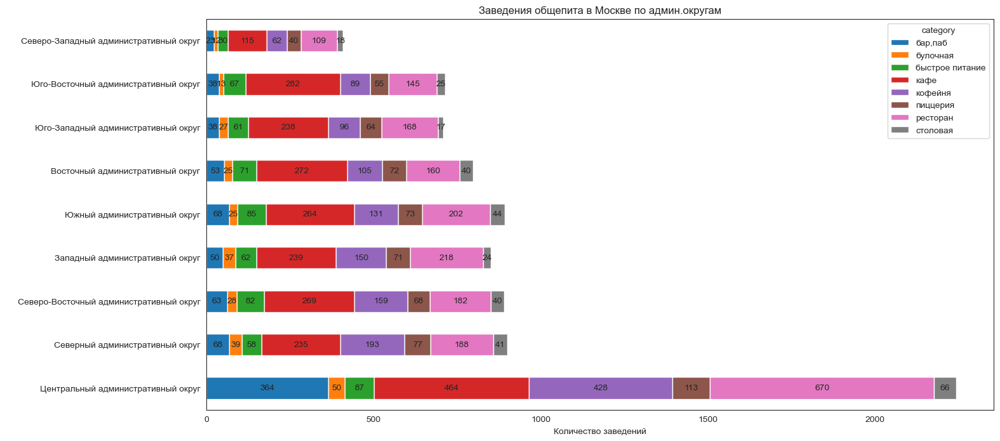

In [120]:
#общее количество заведений и количество заведений каждой категории по округам на одном графике
ax = mplaces.pivot_table(index='district', columns='category', values='name', aggfunc='count').\
sort_values(by=['кофейня'], ascending=False).plot(kind='barh', stacked=True, figsize=(16,8))

plt.title('Заведения общепита в Москве по админ.округам')
plt.xlabel('Количество заведений')
plt.ylabel(' ')

for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    if width > 0:
         ax.annotate(f'{width:0.0f}', xy=(left+width/2, bottom+height/2), ha='center', va='center')

plt.show()

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [122]:
median_rating=mplaces.groupby('category')['rating'].median().sort_values()
median_rating

category
быстрое питание    4.2
кафе               4.2
булочная           4.3
кофейня            4.3
пиццерия           4.3
ресторан           4.3
столовая           4.3
бар,паб            4.4
Name: rating, dtype: float64

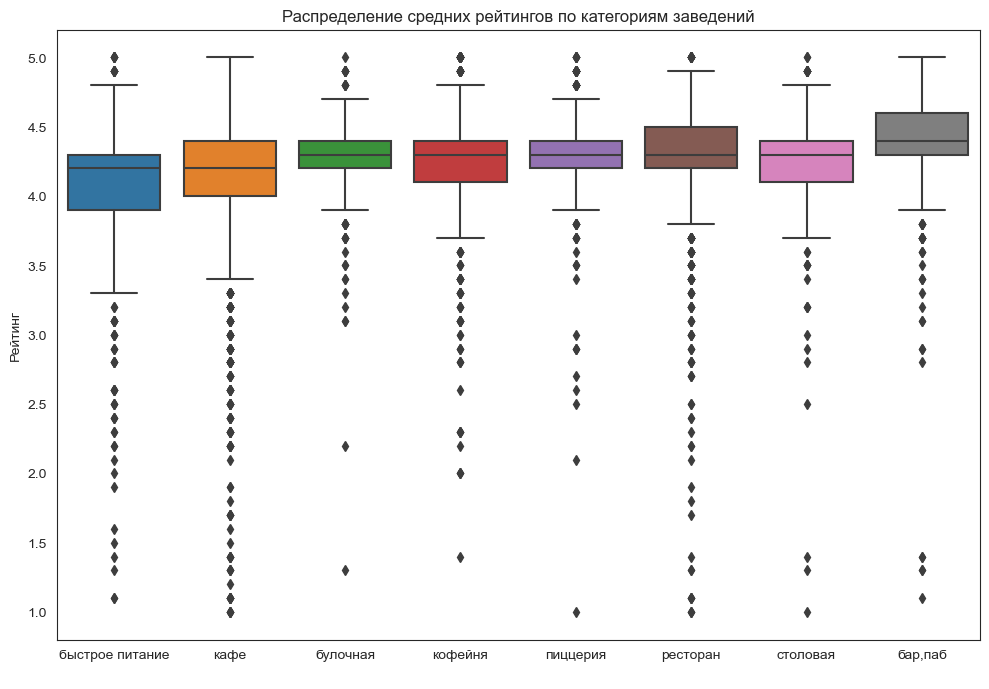

In [123]:
sns.set_style('white')
fig, ax = plt.subplots(figsize=(10, 7))
sns.boxplot(x='category', y='rating', data=mplaces, order=median_rating.index).\
set_title('Распределение средних рейтингов по категориям заведений')
plt.subplots_adjust(bottom=0.8, top=2)
plt.tight_layout()
plt.xlabel(' ')
plt.ylabel('Рейтинг')
plt.show()

In [124]:
# выведем основные статистические характеристики количества посадочных мест по категориям заведений 
mplaces.groupby('category')['rating'].describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",765.0,4.387712,0.380143,1.1,4.3,4.4,4.6,5.0
булочная,256.0,4.268359,0.386303,1.3,4.2,4.3,4.4,5.0
быстрое питание,603.0,4.050249,0.560949,1.1,3.9,4.2,4.3,5.0
кафе,2378.0,4.123886,0.566081,1.0,4.0,4.2,4.4,5.0
кофейня,1413.0,4.277282,0.372250,1.4,4.1,4.3,4.4,5.0
пиццерия,633.0,4.301264,0.336162,1.0,4.2,4.3,4.4,5.0
ресторан,2042.0,4.290402,0.413143,1.0,4.2,4.3,4.5,5.0
столовая,315.0,4.211429,0.454205,1.0,4.1,4.3,4.4,5.0


ВЫВОД: Средний рейтинги по категориям заведений находятся в пределах 4-4.4 балла.

При этом для заведений быстрого питания усредненные рейтинги в целом ниже, чем для других категорий.

Заведения в категори Бары и пабы имют в среднем самые высокие оценки.

Оценки ниже 3.3 для всех категорий являются выбросами.

Но если смотреть на верхнюю границу оценок, то оценка в 5 баллов для категорий кафе, ресторны, бары и пабы входит в нормальное распределение, а вот для остальных категорий является выбросами. Здесь типичным высоким рейтингом являются  баллы до  4.7 - 4.9.

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [127]:
#Посчитаем средний рейтинг для каждого округа
rating_distr = round(mplaces.groupby('district', as_index=False)['rating'].agg('mean'),2).sort_values(by='rating')
rating_distr

,district,rating
6,Юго-Восточный административный округ,4.10
3,Северо-Восточный административный округ,4.15
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
1,Западный административный округ,4.18
8,Южный административный округ,4.18
4,Северо-Западный административный округ,4.21
2,Северный административный округ,4.24
5,Центральный административный округ,4.38


In [128]:
#Чтобы отобразить округа на карте, folium нужно передать границы каждой области. 
#Для этого можно использовать особый текстовый файл в формате GeoJSON.

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [129]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_distr,
    columns=['district', 'rating'],
    key_on="properties.name",
    fill_color='Reds',
    fill_opacity=0.4,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

ВЫВОД:
Диапазон средний рейтингов по округам довольно узкий от 4.1 до 4.38.
ЦАО -самый высокий средний рейтинг 4.38,
На втором месте находится САО - 4.24, на третьем - 4.21.
ЮВАО - самый низкий средний рейтинг 4.10       

In [131]:
# создаём пустой кластер, добавляем его на существующую карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
mplaces.apply(create_clusters, axis=1)

# выводим карту
m


ВЫВОД:
Карта с кластерами дает наглядное представление о количестве заведений общественного питания с возможностью деталиазации по кварталам, улицам до конкретного дома, и это имеет практическое значение при определении места открытия нового заведения.

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [134]:
mplaces.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8405 entries, 0 to 8404
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8405 non-null   object 
 1   category           8405 non-null   object 
 2   address            8405 non-null   object 
 3   district           8405 non-null   object 
 4   hours              8405 non-null   object 
 5   lat                8405 non-null   float64
 6   lng                8405 non-null   float64
 7   rating             8405 non-null   float64
 8   price              8405 non-null   object 
 9   avg_bill           8405 non-null   object 
 10  avg_bill_category  8405 non-null   object 
 11  middle_avg_bill    3149 non-null   float64
 12  middle_coffee_cup  535 non-null    float64
 13  chain              8405 non-null   int64  
 14  seats              4794 non-null   float64
 15  street             8405 non-null   object 
 16  is_24_7            8405 

In [135]:
top_15_street = mplaces.groupby('street', as_index=False)['address'].agg('count').sort_values(by='address', ascending=False).head(15)
top_15_street

,street,address
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [136]:
mplaces.query('street.isin(@top_15_street["street"])',engine='python')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,avg_bill_category,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,Средний счёт,500.0,NaN,0,79.0,Дмитровское шоссе,False
12,заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,Средний счёт,330.0,NaN,0,NaN,МКАД,False
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,Средний счёт,425.0,NaN,0,96.0,Ленинградское шоссе,True
26,пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,Средний счёт,900.0,NaN,0,NaN,Дмитровское шоссе,False
28,mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,Средний счёт,500.0,NaN,0,NaN,МКАД,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8355,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,unknown,unknown,unknown,NaN,NaN,0,NaN,Люблинская улица,False
8395,пекинский двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,Средний счёт,1250.0,NaN,0,200.0,Ленинский проспект,False
8400,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,unknown,unknown,unknown,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,низкие,Средний счёт:от 150 ₽,Средний счёт,150.0,NaN,0,150.0,Люблинская улица,True


In [137]:
#сохраним БД для топ-15 улице
top_15_street_data = mplaces.query('street.isin(@top_15_street["street"])',engine='python')\
.pivot_table(index=['street'], columns =['category'], values='address', aggfunc='count', margins=True)

In [138]:

top_15_street_data1 = top_15_street_data.fillna(0).sort_values(by='All').reset_index()
top_15_street_data1

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
0,Пятницкая улица,9.0,3.0,2.0,7.0,6.0,3.0,18.0,0.0,48
1,улица Миклухо-Маклая,3.0,0.0,4.0,21.0,4.0,2.0,15.0,0.0,49
2,Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0,54
3,улица Вавилова,2.0,2.0,11.0,15.0,10.0,3.0,12.0,0.0,55
4,Люблинская улица,5.0,0.0,5.0,26.0,11.0,1.0,10.0,2.0,60
5,МКАД,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0,65
6,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70
7,Варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0,76
8,Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0,77
9,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88


In [139]:
#переформатируем БД ТОП 15 улиц для построения графика
top_15_street_data = mplaces.query('street.isin(@top_15_street["street"])',engine='python')\
.pivot_table(index=['street', 'category'], values='address', aggfunc='count').reset_index()
top_15_street_data2 = top_15_street_data.fillna(0)
top_15_street_data2

,street,category,address
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [140]:
fig = px.histogram(top_15_street_data2,
            orientation='h',
             x = 'address', 
             y = 'street',
             color = 'category').update_yaxes(categoryorder='sum ascending')

fig.update_layout(
    title_text='Топ-15 улиц Москвы по количеству точек общепита с разбивкой по категориям',  # название графика
    xaxis_title_text='Количеcтво заведений',
    yaxis_title_text=' ',
    bargap=0.3,  # промежуток между полосами координат соседнего местоположения
    template='simple_white', # выберите один из предопределенных шаблонов
)
fig.update_xaxes(tickangle=0)
fig.show()

#здесь почему-то не работают параметры text и textauto

ВЫВОД: Топ-15 улиц по количеству заведений общепита - это одни из самых протяженных улиц в Москве, поэтому мы ут видим различные шоссе и проспекты, в том числе МКАЗ

Исключение составляеn Пятницкая улица, которая находится в центре Москвы (метро Третьяковская).

Проспект Мира - это, с одной стороны, длинная по протяженности улица - 8,9 км, с другой стороны, с плотной многоэтажной застройкой по обеим сторонам, в том числе ту находятся и ВДНХ, и большие современные торговые центры, и новые жилые комплексы типа Триколор, и ЖК с высотными зданиями 50-60хх, и плотная застройка 80-х. 
  </div> 

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [144]:
#найдем улицы с одним объектом общепита
lonely_street = mplaces.groupby('street', as_index=False)['address'].agg('count').sort_values(by='address', ascending=True)
lonely_street = lonely_street.query('address == 1')
lonely_street.head()

,street,address
0,1-й Автозаводский проезд,1
683,Одинцовская улица,1
689,Октябрьский переулок,1
694,Ордынский тупик,1
695,Оренбургская улица,1


In [145]:
len(lonely_street)

458

In [146]:
#Созданим БД таких заведений и посмотрим по категориям и районам
lonely_street_data = mplaces.query('street.isin(@lonely_street["street"])', engine='python')
lonely_street_cat = lonely_street_data.groupby('category')['address'].count().sort_values(ascending = False)
lonely_street_cat = lonely_street_cat.reset_index()
lonely_street_cat['percent'] = round(lonely_street_cat['address']/lonely_street_cat['address'].sum()*100,0).astype(int)
lonely_street_cat 

,category,address,percent
0,кафе,160,35
1,ресторан,93,20
2,кофейня,84,18
3,"бар,паб",39,9
4,столовая,36,8
5,быстрое питание,23,5
6,пиццерия,15,3
7,булочная,8,2


In [147]:
fig = px.pie(lonely_street_data.groupby('category', as_index=False)['address'].count(), values='address', 
             names='category', title='Доля одиночных заведений по категориям')

fig.update_layout(legend_title='Категории заведений')
                  
fig.show()

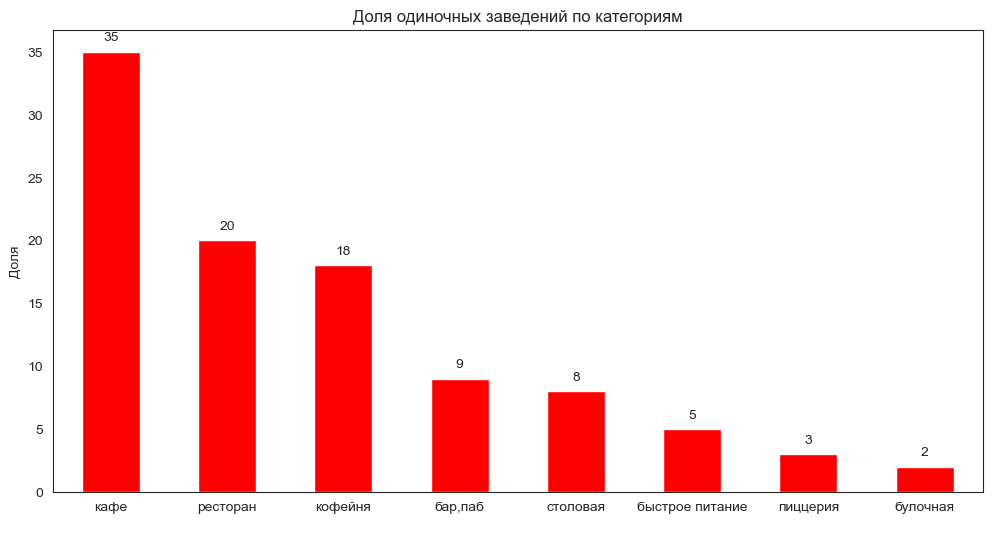

In [148]:
ax = lonely_street_cat.plot(x='category', y='percent', kind='bar', color='red', legend=False, figsize=(12,6))

plt.title('Доля одиночных заведений по категориям')
plt.xlabel(' ')
plt.ylabel('Доля')
plt.xticks(rotation=0)

for p in ax.patches:
    ax.annotate(text=np.round(p.get_height(), decimals=2),
                xy=(p.get_x()+p.get_width()/2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()

In [149]:
# выведем основные статистические характеристики количества посадочных мест по категориям заведений 
mplaces.query('seats.isnull() != True').groupby('category')['seats'].median().sort_values(ascending = False)

category
ресторан           86.0
бар,паб            82.5
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

In [150]:
lonely_street_data.pivot_table(index=['chain'], columns=['district'], values='address', aggfunc='count', margins=True) 

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ,All
chain,,,,,,,,,,
0,39,25,38,33,13,104,29,11,33,325
1,13,10,14,22,6,41,10,7,10,133
All,52,35,52,55,19,145,39,18,43,458


In [151]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


# создаём пустой кластер, добавляем его на существующую карту
marker_cluster = MarkerCluster().add_to(m2)

# применяем функцию create_clusters() к каждой строке датафрейма
lonely_street_data.apply(create_clusters, axis=1)

# выводим карту
m2


Вывод: В Москве есть 458 улиц, на которых распологается только 1 заведение. Скороее всего, это короткие по протяженности улицы, поэтому среди них много проездов и переулков. Большинство заведений на таких улицах - это кафе - 35%, на второму месте  - рестораны -20% и на третьем кафе - 18%.

Основное количество находится в ЦАО, что только подтверждает гипотезу, что такие заведение находятся на очень коротких по длине улицах. Практически треть заведений являются сетевыми.

Медианное количество посадочных места в таких заведениях меньше, чем в целом по Москве. Это релеватно для всех категорий заведений.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. 
Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [154]:
#Ценовой индикатор района
price_distr = mplaces.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
price_distr['district'] = price_distr['district'].astype('str')
price_distr.sort_values(by='middle_avg_bill', ascending = False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [155]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
fig = Choropleth(
    geo_data=state_geo,
    data=price_distr,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend=True,
    legend_name='Медианный размер средних чеков по округам',
).add_to(m3)

# выводим карту
m3

ВЫВОД: Согласно медианному размеру среднего чека, наиболее дорогие заведения общепита находятся в Центральном и Западном округах (Рублевка). Далее в рейтинге по убыванию идут Северо-Западный и Северный округа. 

Удаленность от центра в целом влияет на средний счет, но мы видим, что есть более "престижные" округа с макимальным средним счетом и округа "попроще". 

Так, средний счет ЮВАО в 2 раза меньше, чем в Западной округе.

ОБЩИЙ ВЫВОД:
Всего в Москве 8406 точек общепита.
Самые популярные категории:

1. Кафе (2378 заведений) - 28%

2. Рестораны (2043 заведения) -  24%

3. Кофейни (1413 заведений) - 17%  

Оставшихся 31% точек общепита - это бары и пабы, пиццерии, быстрое питание, столовые и булочные.

38% - сетевые заведения, 62% - несетевыею
Наибольшее количество сетевых заведений встречается в категориях булочная, пицерия и кофейня.
Меньше всего сетевых заведений в категории бар,паб, что и видно на графике.

Далее мы исследовали медианное значение посадочных мест по категориям точек, которое показало, что наименьше количество посадочных мест в булочных, наибольшее - в ресторанах.

По статистическим характеристикам можно определить эффективное количество мест в заведении в соответствии с форматом. 

Так, 25% квартиль показывает, в заведении должно быть не менее 25-30 посадочных мест для булочных, заведений быстрого питаний и пиццерий, и не менее 40 мест  - для кофейн и столовых, 38 - для кафе и 48 - для ресторанов и баров. Это вполне объяснимо: чем чаще сменяемость клиентов, тем меньше можно установить посадочных мест. Для ресторано и пабов(баров), где люди задерживаются намного дольше, количество посадочных мест в среднем будет больше.

Диаграмма распределения визуально показывает выбросы по количеству мест по каждой категории заведения. Как ориентир для оптималное максимального количества мест можно считат 75% квантиль.

ТОП-15 СЕТЕВЫХ ТОЧЕК
В большинстве своем они являются кофейнями, булочными, пицериями, скажем, заведениями малого формата с большой проходимостью людей. 

При этом Теремок и Prime, хотя и относятся к категории "ресторан", явно являются классическими кафе по типу Братев Караваевых, Яндекс Лавка тоже не является рестораном, а скорее, магазином-кафе готовой еды. 

В ТОП-15 из ресторанов попали Тануки и VASILCHUKÍ Chaihona №1 - 14 и 15 место соответственно.

ОБЩЕПИТ ПО ОКРУГАМ МОСКВЫ.
Во всех округах Москвы присутствуют заведения всех возможных категорий.

Наибольшее количество заведение - 2242- находится в Центральном АО, наименьшее 409 - в Северо-Западном.

И если структура распределений категорий по округам более-менее похожа: 1 место - кафе, 2 место = рестораны, 3 место - кофени, что мы и видим из графика, то ЦАО на их фоне выделяется тем, что на самая многочисленная категория  - это рестораны (2 и 3 занимают также кафе и кофейни). 

И если пабы, бары в остальном Москве находятс на 5-6 местах, то в ЦАО  - это 4 место, причем по численности не намного уступают популярным кофейням.

Самые малочисленные категори во всех округах без исключения - это столовые и булочные.

РЕЙТИНГИ

Средний рейтинги по категориям заведений находятся в пределах 4-4.4 балла.

При этом для заведений быстрого питания усредненные рейтинги в целом ниже, чем для других категорий.

Заведения в категори Бары и пабы имют в среднем самые высокие оценки.

Оценки ниже 3.3 для всех категорий являются выбросами.

Но если смотреть на верхнюю границу оценок, то оценка в 5 баллов для категорий кафе, ресторны, бары и пабы входит в нормальное распределение, а вот для остальных категорий является выбросами. Здесь типичным высоким рейтингом являются  баллы до  4.7 - 4.9.

ТОП-15 УЛИЦ ПО КОЛИЧЕСТВУ ТОЧЕК ОБЩЕПИТА

Топ-15 улиц по количеству заведений общепита - это одни из самых протяженных улиц в Москве, поэтому мы ут видим различные шоссе и проспекты, в том числе МКАЗ

Исключение составляем Пятницкая улица, которая находится в центре Москвы (метро Третьяковская)

УЛИЦЫ С ОДНОЙ ТОЧКОЙ ОБЩЕПИТА

В Москве есть 458 улиц, на которых распологается только 1 заведение. Скороее всего, это короткие по протяженности улицы, поэтому среди них много проездов и переулков. Большинство заведений на таких улицах - это кафе.

Основное количество находтся в ЦАО, что только подтверждает гипотезу, что такие заведение находятся на очень коротких по длине улицах. Практически треть заведений являются сетевыми.

Медианное количество посадочных места в таких заведениях меньше, чем в целом по Москве. Это релеватно для всех категорий заведений.

СРЕДНИЙ ЧЕК И ОКРУГ МОСКВЫ

Согласно медианному размеру среднего чека, наиболее дорогие заведения общепита находятся в Центральном и Западном округах (Рублевка). Далее в рейтинге по убыванию идут Северо-Западный и Северный округа. 

Удаленность от центра в целом влияет на средний счет, но мы видим, что есть более "престижные" округа с макимальным средним счетом и округа "попроще". 

Так, средний счет ЮВАО в 2 раза меньше, чем в Западной округе.

## Шаг 4. Детализируем исследование: открытие кофейни

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [160]:
#сохраним кофейни в отдельных датасет
coffee_df = mplaces.query('category ==  "кофейня"')
coffee_df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,avg_bill_category,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,Цена чашки капучино,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,unknown,unknown,unknown,NaN,NaN,1,NaN,парк Левобережный,False
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,низкие,unknown,unknown,NaN,NaN,1,46.0,Коровинское шоссе,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,низкие,unknown,unknown,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,низкие,unknown,unknown,NaN,NaN,1,NaN,улица Дыбенко,False


Сколько кофеен, сетевый vs несетевые, посадочные места, по округам, медианные рейтинги, price?

In [162]:
coffee_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1413 entries, 3 to 8399
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1413 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              1413 non-null   object 
 9   avg_bill           1413 non-null   object 
 10  avg_bill_category  1413 non-null   object 
 11  middle_avg_bill    200 non-null    float64
 12  middle_coffee_cup  521 non-null    float64
 13  chain              1413 non-null   int64  
 14  seats              751 non-null    float64
 15  street             1413 non-null   object 
 16  is_24_7            1413 non-n

In [163]:
coffee_distr = coffee_df.pivot_table(index=['district'], columns='chain', values=['address'], aggfunc='count')
coffee_distr.columns=['несетевые', 'сетевые']
coffee_distr['все']=coffee_distr['несетевые']+coffee_distr['сетевые']
coffee_distr=coffee_distr.sort_values(by='все', ascending=True).reset_index()
coffee_distr['несетевые_%']=round(coffee_distr['несетевые']/coffee_distr['все']*100,0).astype(int)
coffee_distr['сетевые_%']=100-coffee_distr['несетевые_%']
coffee_distr = coffee_distr.sort_values(by=['все'])
coffee_distr

,district,несетевые,сетевые,все,несетевые_%,сетевые_%
0,Северо-Западный административный округ,28,34,62,45,55
1,Юго-Восточный административный округ,60,29,89,67,33
2,Юго-Западный административный округ,46,50,96,48,52
3,Восточный административный округ,54,51,105,51,49
4,Южный административный округ,65,66,131,50,50
5,Западный административный округ,57,93,150,38,62
6,Северо-Восточный административный округ,80,79,159,50,50
7,Северный административный округ,96,97,193,50,50
8,Центральный административный округ,207,221,428,48,52


In [164]:
fig = px.bar(coffee_distr, 
             orientation='h',
             x="все", y="district",
            title='Количество кофеен по округам Москвы',
            labels={"все": "Количество кофеен",  "district": " "},
            color_discrete_sequence =['red']*len(coffee_distr),
            text='все')
fig.update_layout(width=900, height=600, bargap=0.4)
fig.show()

In [165]:
coffee_distr.sort_values(by=['сетевые_%'])

,district,несетевые,сетевые,все,несетевые_%,сетевые_%
1,Юго-Восточный административный округ,60,29,89,67,33
3,Восточный административный округ,54,51,105,51,49
4,Южный административный округ,65,66,131,50,50
6,Северо-Восточный административный округ,80,79,159,50,50
7,Северный административный округ,96,97,193,50,50
2,Юго-Западный административный округ,46,50,96,48,52
8,Центральный административный округ,207,221,428,48,52
0,Северо-Западный административный округ,28,34,62,45,55
5,Западный административный округ,57,93,150,38,62


In [166]:
fig = px.bar(coffee_distr.sort_values(by=['сетевые_%']), 
             orientation='h',
             y="district", 
             x=["несетевые_%", "сетевые_%"],
            labels={"value": "Доля кофеен по типу", "variable": "Типы кофеен", "district": " "},
            title='Сетевые vs несетевые кофейни в Москве по округам, %',
            color_discrete_map={'несетевые_%': 'darkblue', 'сетевые_%': 'yellow'})
fig.update_layout(width=800, height=400, bargap=0.4)
fig.show()

# text_auto=True здесь не работает, поэттому не могу отобразить значения

In [167]:
#топ-10 сетевых кофеен
coffee_df.query('chain == 1').pivot_table(index=['name', 'price'], values='address', aggfunc='count').\
sort_values(by='address', ascending=False).head(10)

,,address
name,price,
шоколадница,средние,116
one price coffee,низкие,70
cofix,низкие,62
кофепорт,низкие,42
cofefest,низкие,27
кофемания,высокие,20
cinnabon,низкие,18
правда кофе,низкие,13
krispy kreme,средние,8


In [168]:
#Распределение кофеен по округам

m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

fig = Choropleth(
    geo_data=state_geo,
    data=coffee_distr,
    columns=['district', 'все'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.9,
    legend=True,
    legend_name='Распределение кофеен по округам',
).add_to(m4)

m4

In [169]:
# создаём пустой кластер, добавляем его на существующую карту
marker_cluster = MarkerCluster().add_to(m4)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_df.apply(create_clusters, axis=1)

# выводим карту
m4

Всего  в Москве 1413 кофеен, из них 51% сетевых. 

Распределены кофейни по округа неравномерно.
Наименьшее количество в СЗАО -62, наибольшее в ЦАО - 428. 
При этом доля несетевых кофеен по округам колеблется от 38% в СЗАО до 68% в ЮВАО.
Карта распределения кофеен в Москве поможет определить места, где кофейни отсутствует или слишком мало.

ЗАО – доля сетей достигает 62%
ЮВАО – всего 33% сетевых заведения

Самые популярные сети: шоколадница, One price coffee, cofix, кофепорт.

6 сетевых кофеен из ТОП-10 находятся в низкой ценовом сегменте

### Есть ли круглосуточные кофейни?

In [172]:
#сколькко круглосуточных кофеен в Москве
coffee_24 = coffee_df.groupby(['is_24_7'], as_index=False)['address'].count()
coffee_24

,is_24_7,address
0,False,1354
1,True,59


In [173]:
fig = px.pie(coffee_24, values='address', names=coffee_24['is_24_7'].map({'False': 'обычные часы работы', 'True': 'круглосуточное'}),
             title='Доля круглосуточных кофеен в Москве', 
             labels='is_24_7', hole = 0.5, 
             color_discrete_sequence=["#2f4f4f", '#25e611'])

fig.update_layout(legend_title='Работает круглосуточно или нет',
                  title={'x':0.3})
                 
fig.update_traces(textinfo='value + percent')
                  
fig.show()

In [174]:
#среди круглосуточных кофеен, какие являются сетевыми
coffee_24_net = coffee_df.query('is_24_7 == "True"').groupby(['chain'], as_index =False)['is_24_7'].count()
coffee_24_net

,chain,is_24_7
0,0,9
1,1,50


In [175]:
#доля сетевых кафе среди круглосутоных
line_colors = ["#FFFF00", '#0000a0']
fig = px.pie(coffee_24_net, values='is_24_7', 
             names=coffee_24_net['chain'].map({0: 'несетевое', 1: 'сетевое'}), 
             title='Доля сетевых и несетевых кофеен среди круглосуточных в Москве', 
             hole = 0.5,
             color_discrete_sequence=line_colors)

fig.update_layout(legend_title='Сетевая кофейня или нет',
                  title={'x':0.1})
                 
fig.update_traces(textinfo='value + percent')                  
fig.show()

In [176]:
distr_coffee_24 = coffee_df.query('is_24_7 == "True"').groupby('district', as_index=False)['is_24_7'].count()
distr_coffee_24

,district,is_24_7
0,Восточный административный округ,5
1,Западный административный округ,9
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
5,Центральный административный округ,26
6,Юго-Восточный административный округ,1
7,Юго-Западный административный округ,7
8,Южный административный округ,1


In [177]:
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём пустой кластер, добавляем его на существующую карту
marker_cluster = MarkerCluster().add_to(m5)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_df.query('is_24_7 == "True"').apply(create_clusters, axis=1)

# выводим карту
m5

Доля круглосутоных кофеен в Москве всего 4,3%  - 59 заведений. Большинство из них являются сетевыми - 85%: 50 заведений сетевых и 9 несетевых.

Круглосуточные кофейни также расположены неравномерно, основное количество  (26) находится в ЦАО.

Обращает на себя  внимание тот факт, что округа, где преобладают круглосуточные кофейни, - это округа с наиболее высоким средним счетом.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [180]:
coffee_df['rating'].unique()

array([5. , 4.3, 4. , 3.6, 3.8, 3.1, 4.1, 4.9, 4.8, 4.5, 4.4, 4.2, 2.9,
       3.5, 4.6, 3.9, 4.7, 2.2, 2. , 3. , 3.7, 3.2, 2.3, 1.4, 2.6, 3.3,
       3.4, 2.8])

In [181]:
# посмотрим на  основные статистические характеристики рейтинга кофеен по округам 
coffee_df.groupby('district')['rating'].describe().sort_values(by='50%')

,count,mean,std,min,25%,50%,75%,max
district,,,,,,,,
Западный административный округ,150.0,4.195333,0.361454,2.3,4.025,4.2,4.375,5.0
Восточный административный округ,105.0,4.282857,0.376077,3.0,4.100,4.3,4.400,5.0
Северный административный округ,193.0,4.291710,0.444097,2.0,4.100,4.3,4.500,5.0
Северо-Восточный административный округ,159.0,4.216981,0.425487,1.4,4.100,4.3,4.400,5.0
Северо-Западный административный округ,62.0,4.325806,0.430377,2.0,4.200,4.3,4.500,5.0
Центральный административный округ,428.0,4.336449,0.256948,2.3,4.200,4.3,4.400,5.0
Юго-Восточный административный округ,89.0,4.225843,0.514456,2.3,4.100,4.3,4.500,5.0
Юго-Западный административный округ,96.0,4.283333,0.304930,3.3,4.100,4.3,4.500,5.0
Южный административный округ,131.0,4.232824,0.388576,2.0,4.100,4.3,4.400,5.0


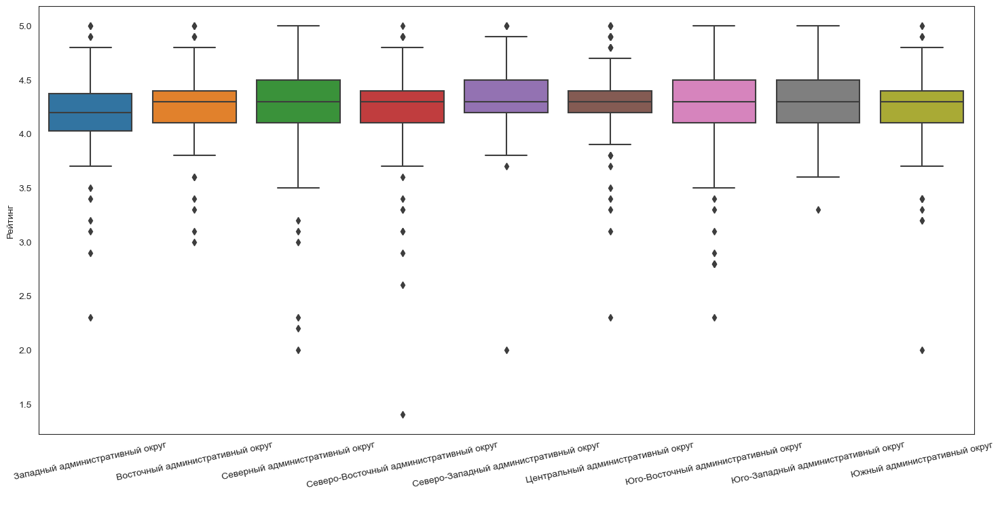

In [182]:
#Рейтинги кофеен и их распределение по округам
sns.set_style('white')
fig, ax = plt.subplots(figsize=(15, 7))
sns.boxplot(x='district', y='rating', data=coffee_df, 
            order=(coffee_df.groupby('district')['rating'].describe().sort_values(by='50%')).index)
plt.subplots_adjust(bottom=0.8, top=2)
plt.tight_layout()
plt.xlabel(' ')
plt.ylabel('Рейтинг')
plt.setp(ax.get_xticklabels(), rotation=12)
plt.show()

Медианная рейтинга кофеен по округам практически не меняется и  находится в районе в 4.1 и 4.2 балла.

50% кофеен имеют оценку между 4.1 и 4.5 балла. Низкими рейтингами для кофейни можно считать рейтинги до 4 баллов. Обращает на себя внимание, что больше всего кофеен с низкими рейтингами находятся в САО, ЮВАО и ЮЗАО, при общем самом низком числе кофеен в этих округах: 62, 89 и 96 заведений соответственно.

В ЦАО наибольшее количество кофеен - 428,у  50% из них рейтинг межд 4.2 и 4.4 бала, максимальный рейтинг 5, с наименьшим количеством кофеен с низким рейтингом.
52% кофеен в ЦАО - сетевые, здесь же находится наибольшее количество круглосуточных кофеен Эти данные говорят, что в ЦАО наблюдается наиболее конкурентная ситуация в данном секторе.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

C:\Users\tanya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



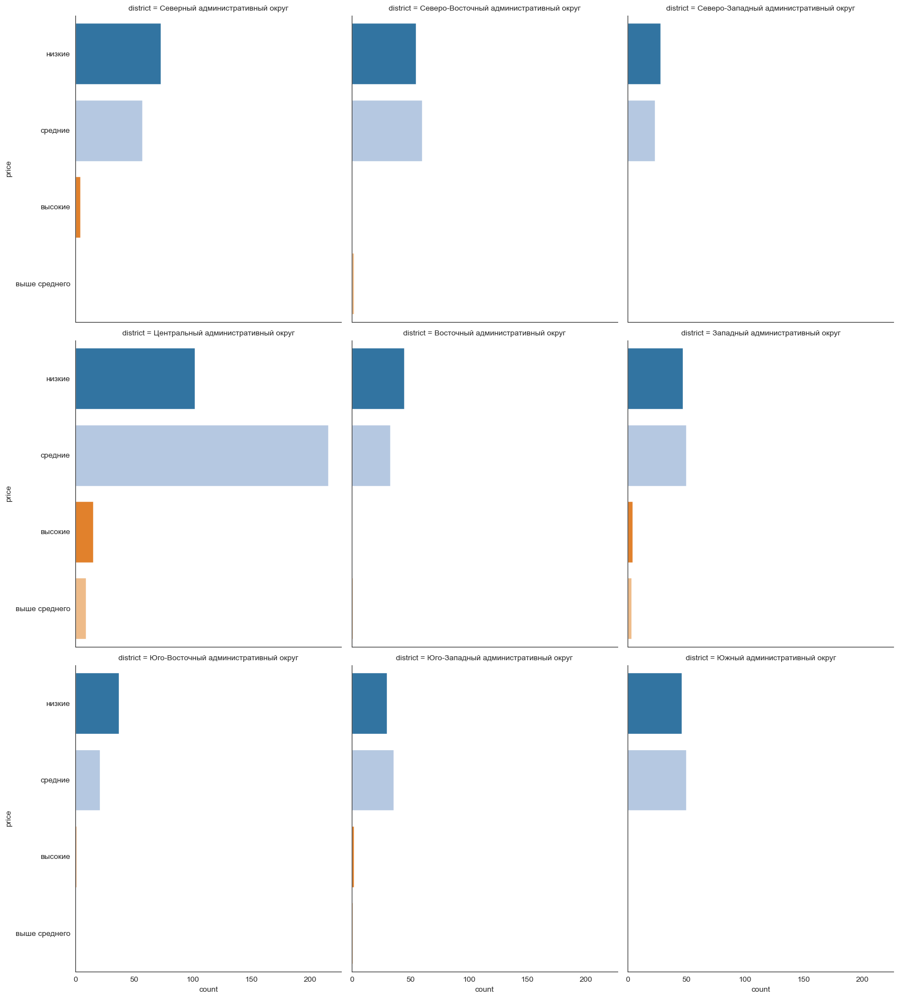

In [185]:
#Распределение кофеен по округам Москвы с учетом категории цены price, из выборки исключены кофейни с категорией цены unknown
sns.catplot(y="price", col="district", col_wrap=3,
                data=coffee_df.query('price != "unknown"'),
                kind="count", height=6, aspect=.9, 
                palette='tab20')
plt.show()

In [186]:
#статистические данные стоимость чашки кофе,исключая NaN
coffe_cappuccino = coffee_df.query('middle_coffee_cup.isnull() !=True').groupby('district')['middle_coffee_cup'].describe()
coffe_cappuccino = coffe_cappuccino.reset_index()
coffe_cappuccino = coffe_cappuccino.replace(['Восточный административный округ', 'Западный административный округ',
         'Северный административный округ', 'Северо-Восточный административный округ','Северо-Западный административный округ',
        'Центральный административный округ', 'Юго-Восточный административный округ', 'Юго-Западный административный округ',
                                            'Южный административный округ']\
        ,['ВАО', 'ЗАО', 'САО', 'СВАО', 'CЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО'])
coffe_cappuccino.sort_values(by='50%', ascending=True)

,district,count,mean,std,min,25%,50%,75%,max
0,ВАО,42.0,174.023810,225.384710,60.0,106.25,135.0,177.50,1568.0
6,ЮВАО,34.0,151.088235,62.421523,60.0,112.50,147.5,173.75,375.0
8,ЮАО,43.0,158.488372,66.133117,60.0,107.50,150.0,202.50,275.0
2,САО,76.0,165.789474,62.668081,60.0,133.00,159.0,204.25,325.0
3,СВАО,60.0,165.333333,63.644049,60.0,123.00,162.5,201.25,297.0
4,CЗАО,21.0,165.523810,60.797713,60.0,124.00,165.0,200.00,270.0
1,ЗАО,49.0,189.938776,74.227243,60.0,130.00,189.0,256.00,300.0
5,ЦАО,162.0,187.518519,67.263201,60.0,139.00,190.0,250.00,328.0
7,ЮЗАО,34.0,184.176471,57.536007,95.0,129.00,198.0,229.25,291.0


In [187]:
import plotly.express as px
fig = px.bar(coffe_cappuccino.sort_values(by='50%'), 
             x='district', y='50%',
            title='Медианная стоимость средней чашки капучино в кофейнях Москвы с разбивкой по округам',
            labels={"50%": "Медианная стоимость капучино",  "district": " "},
            color_discrete_sequence =['red']*len(coffee_distr),
            text='50%')
fig.update_layout(width=900, height=600, bargap=0.4)
fig.show()

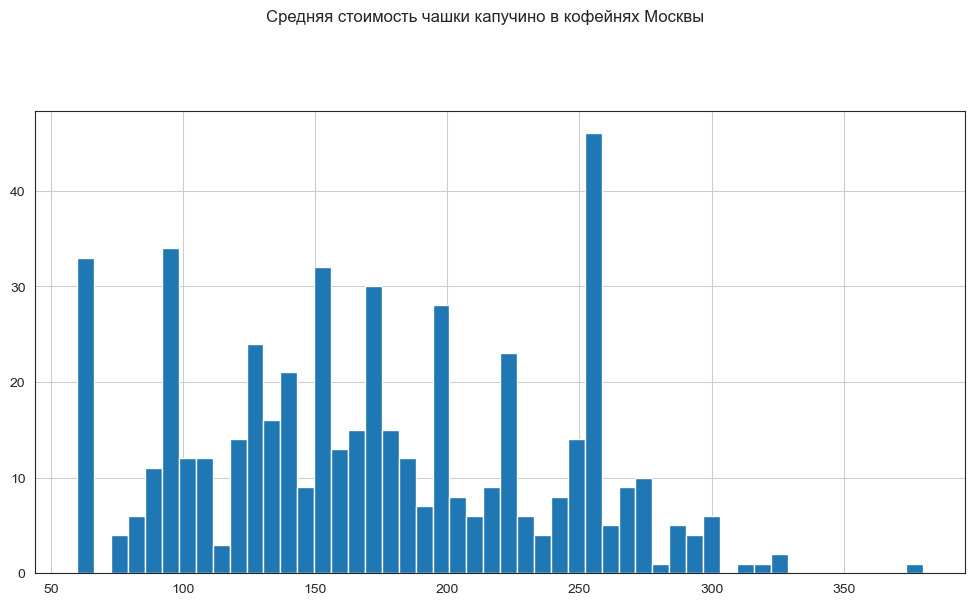

In [188]:
#исключаем их из выборки выброс в виде стоимости чашки кофе в 1568 руб.
coffee_df.loc[(coffee_df['middle_coffee_cup'].isnull() !=True), 'middle_coffee_cup'].hist(figsize=(12,6), range=(60,380), bins=50)
plt.suptitle('Средняя стоимость чашки капучино в кофейнях Москвы', x=0.5, y=1.05, ha='center');

In [189]:
coffee_df.query('middle_coffee_cup.isnull() !=True & middle_coffee_cup >250 & middle_coffee_cup <265').\
pivot_table(index=['name'], values='middle_coffee_cup', aggfunc=['count', 'mean'])

,count,mean
,middle_coffee_cup,middle_coffee_cup
name,,
bloom-n-brew,1,255.00000
carrots and beans,1,260.00000
jeffrey's кофе и сидр,1,254.00000
кофе и мечты,1,259.00000
кофейня на остоженке,1,255.00000
шоколадница,46,256.26087


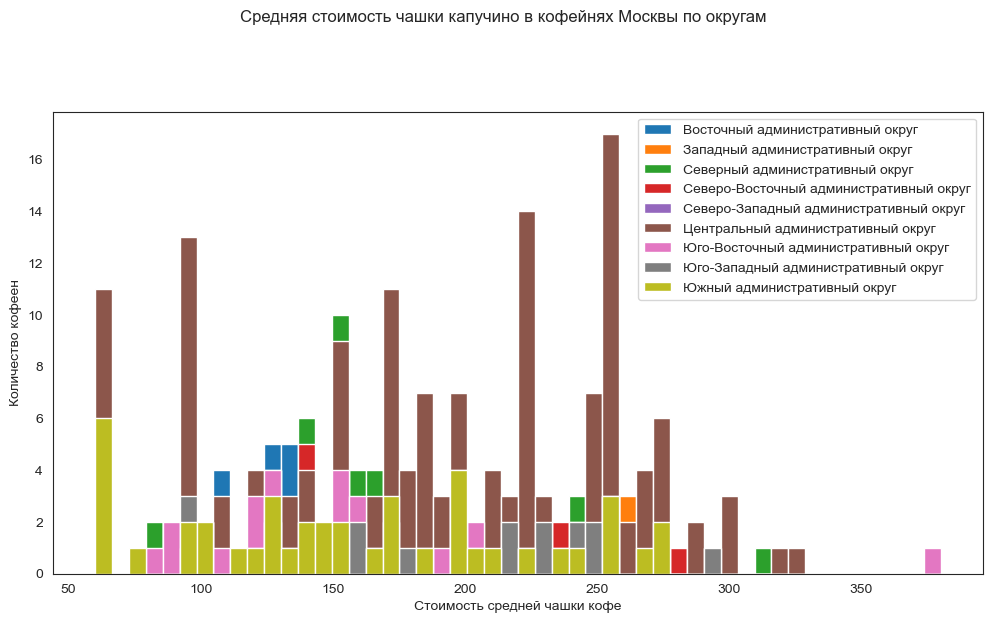

In [190]:
coffee_df.query('middle_coffee_cup.isnull() !=True')\
.groupby('district')['middle_coffee_cup'].plot.hist(figsize=(12,6), range=(60,380), bins=50, legend=True)
plt.suptitle('Средняя стоимость чашки капучино в кофейнях Москвы по округам', x=0.5, y=1.05, ha='center');
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.ylabel('Количество кофеен')
plt.xlabel('Стоимость средней чашки кофе')
plt.show()

In [191]:
coffee_df.query('middle_coffee_cup.isnull() !=True').groupby('district')['middle_coffee_cup'].median().sort_values()

district
Восточный административный округ           135.0
Юго-Восточный административный округ       147.5
Южный административный округ               150.0
Северный административный округ            159.0
Северо-Восточный административный округ    162.5
Северо-Западный административный округ     165.0
Западный административный округ            189.0
Центральный административный округ         190.0
Юго-Западный административный округ        198.0
Name: middle_coffee_cup, dtype: float64

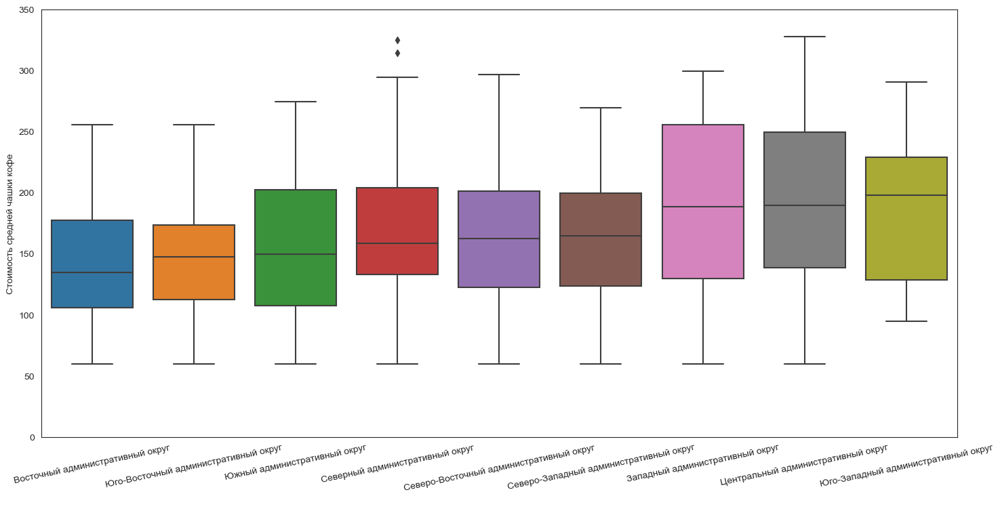

In [192]:
#Распределение стоимости чашки кофе капучино по округа
sns.set_style('white')
fig, ax = plt.subplots(figsize=(15, 7))
sns.boxplot(x='district', y='middle_coffee_cup', 
            data=coffee_df.query('middle_coffee_cup.isnull() !=True'),
           order=coffee_df.query('middle_coffee_cup.isnull() !=True').\
            groupby('district')['middle_coffee_cup'].median().sort_values().index)
plt.subplots_adjust(bottom=0.8, top=2)
ax.set_ylim(50, 380)
plt.tight_layout()
plt.ylim([0,350])
plt.xlabel(' ')
plt.ylabel('Стоимость средней чашки кофе')
plt.setp(ax.get_xticklabels(), rotation=12)
plt.show()

In [193]:
#ТОП-15 улиц с самой высокой средней ценой чашки кофе
coffee_df.query('middle_coffee_cup.isnull() !=True').\
pivot_table(index=['street', 'district'], values='middle_coffee_cup').\
sort_values(by='middle_coffee_cup', ascending=False).head(15)

,,middle_coffee_cup
street,district,
Большая Семёновская улица,Восточный административный округ,851.0
Большая Никитская улица,Центральный административный округ,328.0
3-я Фрунзенская улица,Центральный административный округ,320.0
Богословский переулок,Центральный административный округ,300.0
Большая Сухаревская площадь,Центральный административный округ,300.0
улица Гарибальди,Юго-Западный административный округ,291.0
площадь Победы,Западный административный округ,291.0
3-й Крутицкий переулок,Центральный административный округ,291.0
Милютинский переулок,Центральный административный округ,290.0


In [194]:
#провериим, что за кофейня на Большой Семеновской
coffee_df.query('middle_coffee_cup.isnull() !=True & street == "Большая Семёновская улица"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,avg_bill_category,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
2575,кофейная история,кофейня,"Москва, Большая Семёновская улица, 10, стр. 13",Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 10:00–20:00",55.782477,37.702322,5.0,низкие,Цена чашки капучино:119–149 ₽,Цена чашки капучино,NaN,134.0,0,NaN,Большая Семёновская улица,False
2858,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,Цена чашки капучино,NaN,1568.0,1,48.0,Большая Семёновская улица,False


In [195]:
#ТОП-15 улиц с самой высокой средней ценой чашки кофе без кофейни с чашкой кофе = 1568,00 руб.
coffee_df.query('middle_coffee_cup.isnull() !=True & middle_coffee_cup!=1568').\
pivot_table(index=['street', 'district'], values='middle_coffee_cup').\
sort_values(by='middle_coffee_cup', ascending=False).head(15)

,,middle_coffee_cup
street,district,
Большая Никитская улица,Центральный административный округ,328.0
3-я Фрунзенская улица,Центральный административный округ,320.0
Богословский переулок,Центральный административный округ,300.0
Большая Сухаревская площадь,Центральный административный округ,300.0
улица Гарибальди,Юго-Западный административный округ,291.0
площадь Победы,Западный административный округ,291.0
3-й Крутицкий переулок,Центральный административный округ,291.0
Милютинский переулок,Центральный административный округ,290.0
Енисейская улица,Северо-Восточный административный округ,287.0


In [196]:
#ТОП-15 улиц с самыми высокими средними рейтингами
coffee_df.groupby('street')['rating'].mean().sort_values(ascending=False).head(15)

street
Западный административный округ    5.00
3-я Радиаторская улица             5.00
3-й Силикатный проезд              5.00
Лубянский проезд                   5.00
Суздальская улица                  5.00
2-я Кабельная улица                5.00
Никулинская улица                  5.00
улица Академика Арцимовича         5.00
Светлогорский проезд               5.00
улица Сретенка                     4.95
проспект 60-летия Октября          4.90
Бескудниковский бульвар            4.90
Домодедовская улица                4.90
улица Бестужевых                   4.90
Абельмановская улица               4.90
Name: rating, dtype: float64

In [197]:
#какой реальный адрес у данной кофейни
coffee_df.query('street == "Западный административный округ"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,avg_bill_category,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
5643,дворик невского,кофейня,"Москва, Западный административный округ, район...",Западный административный округ,"ежедневно, 10:00–20:00",55.679118,37.480924,5.0,unknown,unknown,unknown,NaN,NaN,0,NaN,Западный административный округ,False


In [198]:
#ТОП-15 улиц с самыми высокими средними рейтингами без кофейни выше
coffee_df.query('street != "Западный административный округ"').\
pivot_table(index=['street', 'district'], values ='rating').sort_values(by='rating', ascending=False).head(15)

,,rating
street,district,
3-я Радиаторская улица,Северный административный округ,5.00
Лубянский проезд,Центральный административный округ,5.00
2-я Кабельная улица,Юго-Восточный административный округ,5.00
улица Академика Арцимовича,Юго-Западный административный округ,5.00
Суздальская улица,Восточный административный округ,5.00
3-й Силикатный проезд,Северо-Западный административный округ,5.00
Светлогорский проезд,Северо-Западный административный округ,5.00
Никулинская улица,Западный административный округ,5.00
улица Сретенка,Центральный административный округ,4.95


## Выводы

Стоимость чашки капучино в Москве колеблется от 60 до 1568 рублей за чашку.

Наиболее встречаемая стоимость чашки капучино  = это порядка 260 руб, а втором месте - 90 руб, а на третьем  - минимальная стоимость в 60 руб.

На общем фоне выделаются кофени кофейни со средней чашкой капучино > 250 и < 265 - это 51 кофейня, 46  заведений из них– это кофейни сети Шоколадница.

Распределение кофеен по округам Москвы с учетом категории цены price (из выборки исключены кофейни с категорией цены unknown) показывает, что все округа можно разделить на две категории.
1 категория. Преобладают кофейни в низкой ценовой категории
2 категория. Остальные: преобладают либо кофейни в средней ценовой категории либо количество кофеен в низкой и средней ценовой категорией практически одинаково

1 категория: САО, СЗАО, ВАО, ЮВАО
1 категория: ЦАО, СВАО, ЗАО, ЮЗАО, ЮАО

ЦАО и ЗАО- кофейни с категорией цены выше среднего. 
Не во всех округах есть кофейни с категорией высокие цены. Мы видим их только в ЦАО, ЗАО, ЮЗАО и САО.

Следовательно, при определении стоимости чашки капучино, необходимо учитывать, в каком округ будет открываться кофейня.

Улица с кофейнями с самыми высокими рейтингами могут находится в разных округах, но Центральный АО и здесь остается лидером  - 33% улиц находится именно здесь


Статистические данные стоимость чашки капучино показыают, что медианная стоимости значительно отличается по округам и может варьировать от 135 руб. в ВАО и 198 в ЗАО.
Наиболее низкая медианная стоимость - в кофейнях ВАО - 135 рублей, наибольшее высокая в ЗАО, ЦАО и ЮЗАО - 189, 190 и 198 соответственно.
Наибольший разброс цен в двух округах Москвы  - ЦАО и ЗАО, здесь уровень чашки капучино у 50% кофеен находится в диапазоне от 130 до 256 рублей. 
Наиболее низкая стоимость чашки капучино - в ЮВАО и ВАО, здесь диапазон стоиомости капучино находится  в диапазоне от 117 руб. до 173 руб. для в ЮВАО и от 106 до 177 для ВАО.
Таким образом, при определении стоимости чашки капучино, необходимо учитывать, в каком округе будет открываться кофейня и приниматься во внимание медианную стоиомость по округам. Цена не должна превышать верхний квантиль этой стоимость по округам, а для конкуренции по цене ориентироваться на стоимость не выше нижнего квантиля. Это значение стоимости капучино, ниже которого стоиомсть капучино будет только у четверти (25%) кофеен по округу.

Большинство улиц с самыми высокими ценами чашки капучино находятся в Центральном АО

Улица с кофейнями с самыми высокими рейтингами могут находится в разных округах, но Центральный АО и здесь остается лидером  - 33% улиц находятся именно здесь.



ТОП-3 аргумента для открытия кофейни в СЗАО: <br>
    1. Наименьшее количество кофеен в этом округе. <br>
    2. 55% - это сети. Там, где открываются сети, всегда является признаком того, что стОит присмотреться к этой территории, с одной стороны. С другой стороны, мы можем говорить о переизбытке сетей в округе, и возможно, новая оригинальная кофеня здесь привлечет внимание.<br>
    3. Всего 2 круглосуточных кофейни.<br>
    4. У 75% кофеен средняя стоимость чашки капучино находится в диапазоне от  124.00 до 200, медиана - 165.0. Это дает возможность либо открыть кофейню в категории цен "Высокие", которые здесь не представлены, либо наоброт конкурировать по цене, в этом округе еще есть такая возможность: распределение стоимости чашки кофе капучино показывает, что только у 25% кофеен стоимость капучино - до 124 руб. (для сравнения в в ВАО у 25% кофеен - это 106 руб.)   </div> 